## Rainfall Weather Prediction

### Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
- Problem Statement:

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing data set
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


### Data set description

- Date  - The date of observation

- Location  -The common name of the location of the weather station

- MinTemp  -The minimum temperature in degrees celsius

- MaxTemp -The maximum temperature in degrees celsius

- Rainfall  -The amount of rainfall recorded for the day in mm

- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- Sunshine  -The number of hours of bright sunshine in the day.

- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- WindDir9am -Direction of the wind at 9am

- WindDir3pm -Direction of the wind at 3pm

- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- Humidity9am -Humidity (percent) at 9am

- Humidity3pm -Humidity (percent) at 3pm

- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- Cloud9am - Fraction of sky obscured by cloud at 9am.

- Cloud3pm -Fraction of sky obscured by cloud

- Temp9am-Temperature (degrees C) at 9am

- Temp3pm -Temperature (degrees C) at 3pm

- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

### To predict:
1- RainTomorrow

2- RainToday

### EDA (Exploratory Data Analysis)

In [5]:
#Checking for shape
df.shape

(8425, 23)

The data set contains 8425 rows and 23 columns.

In [6]:
#Checking for columns
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

These are the names of the columns present in the data set.

In [7]:
#Checking for nulls
df.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

There are alot of nulls present in the data set. We have to deal with it later.

In [8]:
#Checking for data types
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

This shows that the data set contains 16 float and 7 object values.

In [9]:
#Checking for info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

This gives the information about the column names, range index, non-null counts, data types and memory usage.

In [3]:
#Checking for categorical columns
cat_col = []
for i in df.dtypes.index:
    if df.dtypes[i] == "object":
        cat_col.append(i)
print("Categorical columns:", cat_col)
print("\n")


#Checking for numerical columns
num_col = []
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical columns:", num_col)
print("\n")

Categorical columns: ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical columns: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']




We can see the categorical and numerical columns present in the dataset.

In [11]:
#Checking for unique values
df.nunique().to_frame('columns')

,columns
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16


From the above info() method we saw that Date contains object data. So we need to convert it to datetime format.
And as it has the highest no. of unique values present let's set it as the index.

In [4]:
#Setting Date as DataFrame Index
df.set_index('Date', inplace=True)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


Now we have successfully set Date as index. Let's move ahead.

In [13]:
#Checking for duplicate values in the dataset
print("Total duplicate values are :", df.duplicated().sum())

Total duplicate values are : 1673


As there are categorical data so there is a higher chance of getting duplicate values no doubt.

In [14]:
#Checking the value count for each column
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: MinTemp, Length: 285, dtype: int64


19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
11.2     1
43.1     1
42.7     1
42.9     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64


0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64


4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
17.0      1
18.6      1
22.4      1
19.2      1
0.7       1
Name: Evaporation, Length: 116, dtype: int64


0

We can see there are no nulls or white spaces present here.

In [5]:
#Let's fill the nulls of the numerical data first
df['MinTemp'] = df['MinTemp'].fillna(df['MinTemp'].mean())

df['MaxTemp'] = df['MaxTemp'].fillna(df['MaxTemp'].mean())

df['Rainfall'] = df['Rainfall'].fillna(df['Rainfall'].mean())

df['Evaporation'] = df['Evaporation'].fillna(df['Evaporation'].mean())

df['Sunshine'] = df['Sunshine'].fillna(df['Sunshine'].mean())

df['WindGustSpeed'] = df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())

df['WindSpeed9am'] = df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())

df['WindSpeed3pm'] = df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())

df['Humidity9am'] = df['Humidity9am'].fillna(df['Humidity9am'].mean())

df['Humidity3pm'] = df['Humidity3pm'].fillna(df['Humidity3pm'].mean())

df['Pressure9am'] = df['Pressure9am'].fillna(df['Pressure9am'].mean())

df['Pressure3pm'] = df['Pressure3pm'].fillna(df['Pressure3pm'].mean())

df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())

df['Cloud3pm'] = df['Cloud3pm'].fillna(df['Cloud3pm'].mean())

df['Temp9am'] = df['Temp9am'].fillna(df['Temp9am'].mean())

df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

In [6]:
#Let's check
df.isna().sum()

Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
dtype: int64

We have successfully filled the nulls in numerical columns.

In [17]:
#Checking the description
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


This gives the statistical information about the dataset. It gives the data count, mean, standard deviation, min, 25%, 50% & 75% quantiles and max values of the dataset. It works only on numerical data.

From the above describe() method we can notice that:
1. the count of every column is same that means there are no missing values.
2. the median(50%) value is mostly same in every column which means there is a slight skewness in the data.
3. by summerizing the whole dataset we can see there are some differences between 75% and max. Hence, there are some outliers present in the dataset.

### Data Visualization

#### For 1- RainTomorrow

#### Univariate Analysis

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64


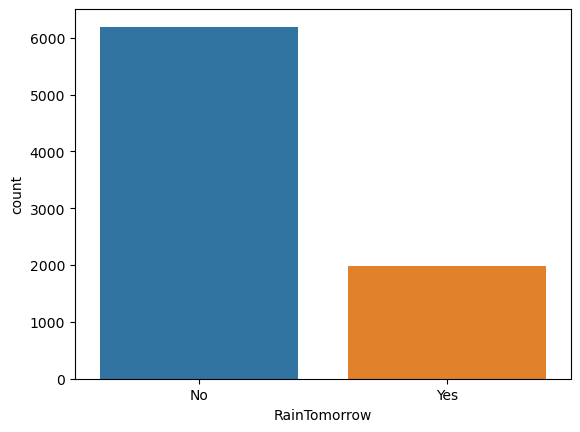

In [18]:
#Visualizing the label
ax = sns.countplot(x='RainTomorrow', data=df)
print(df['RainTomorrow'].value_counts())

Here, we can see that there is a high chance that it will not rain tomorrow as the number of 'No' is gretaer than number of 'Yes'.

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


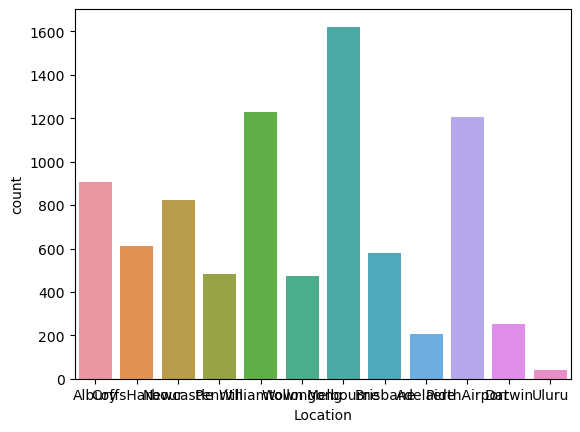

In [25]:
#Visualizing Location
ax = sns.countplot(x='Location', data=df)
print(df['Location'].value_counts())

Here, we can see that Melbourne has most of the weather stations present followed by Williamtown and PerthAirport.

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64


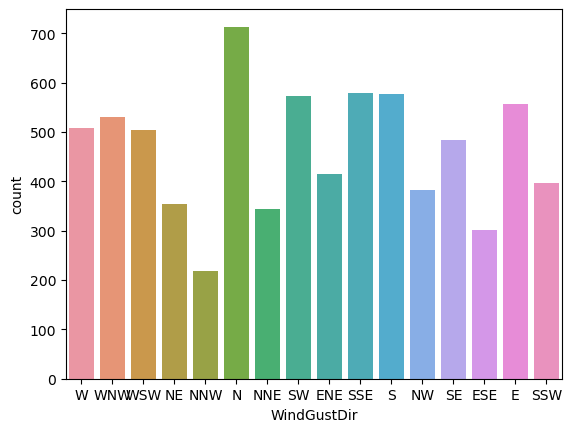

In [21]:
#Visulaizing WindGustDir
ax = sns.countplot(x='WindGustDir', data=df)
print(df['WindGustDir'].value_counts())

Here, the plot shows the direction of the strongest wind gust in the 24 hours to midnight towards the North is higher than others.

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64


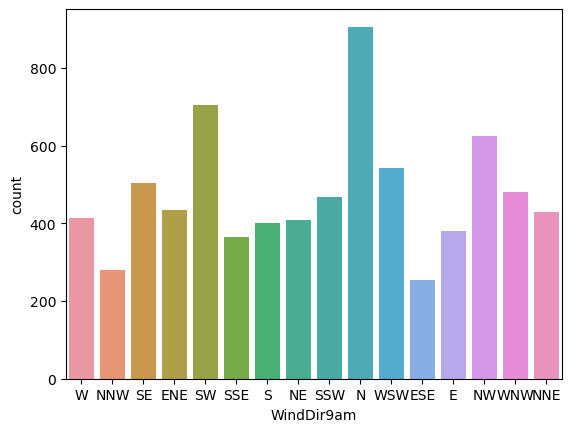

In [22]:
#Visulaizing WindDir9am
ax = sns.countplot(x='WindDir9am', data=df)
print(df['WindDir9am'].value_counts())

Here, the direction of wind at 9 am is higher towards north.

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64


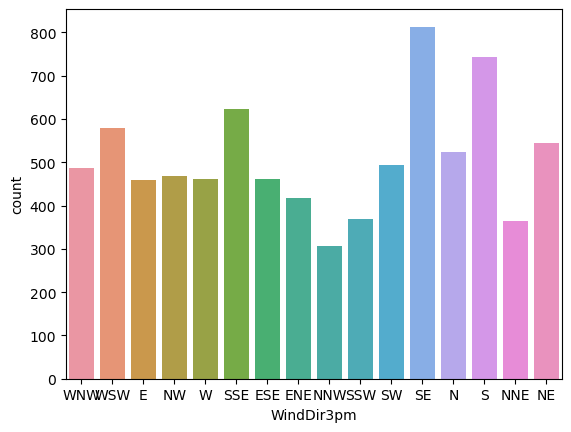

In [23]:
#Visulaizing WindDir3pm
ax = sns.countplot(x='WindDir3pm', data=df)
print(df['WindDir3pm'].value_counts())

Around 3 pm the direction of the wind is higher towards southeast.

No     6195
Yes    1990
Name: RainToday, dtype: int64


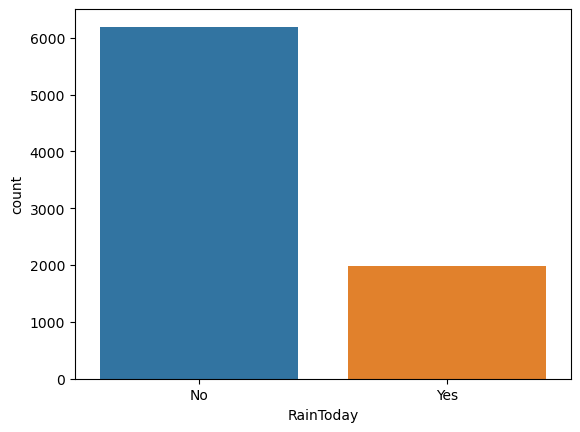

In [24]:
#Visulaizing RainToday
ax = sns.countplot(x='RainToday', data=df)
print(df['RainToday'].value_counts())

We can see that there is a high probability of no rain for today.

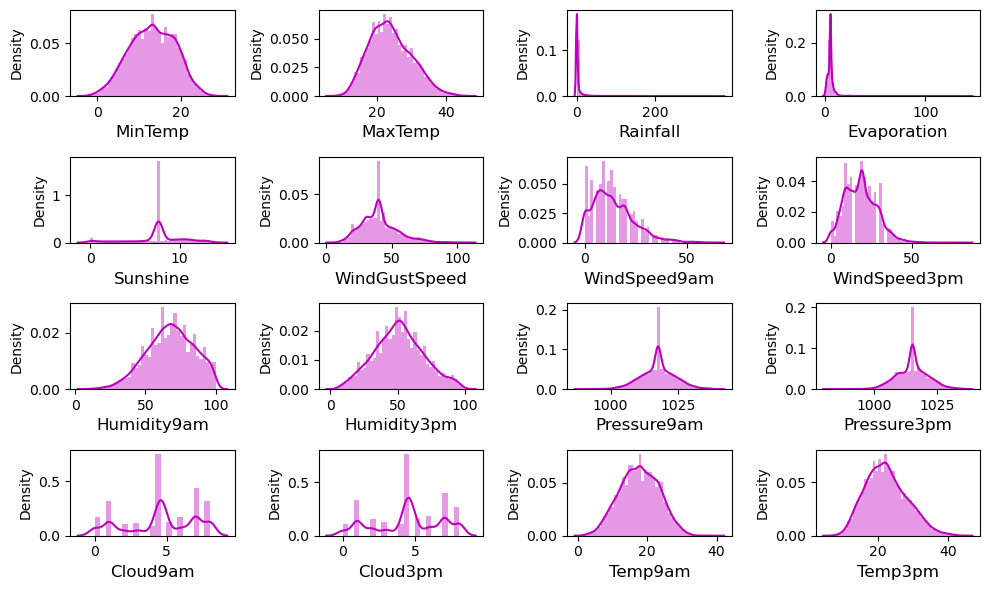

In [26]:
#Vsualizing rest of the data using distplot
plt.figure(figsize= (10,6), facecolor='white')
plotnumber=1
for col in num_col:
    if plotnumber<=16:
        ax = plt.subplot(4,4, plotnumber)
        sns.distplot(df[col], color = "m")
        plt.xlabel(col, fontsize = 12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
    plt.tight_layout()

From the above distplot we can notice some skewness present in the data. We will deal with them later.

#### Bivariate Analysis

 13.193305    75
 12.000000    74
 13.200000    71
 13.800000    69
 12.700000    68
              ..
-1.100000      1
 1.400000      1
-1.400000      1
-1.700000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64


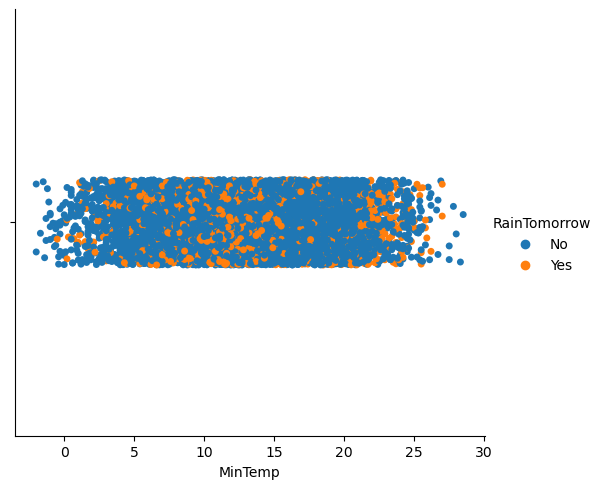

In [36]:
#Visualizing MinTemp w.rt. the label
ax = sns.catplot(x='MinTemp', data=df, hue='RainTomorrow')
print(df['MinTemp'].value_counts())

Here, we can see that there is a little chance of rain for tomorrow despite being minimum temperature.

19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
8.2      1
10.3     1
39.7     1
9.4      1
43.5     1
Name: MaxTemp, Length: 332, dtype: int64


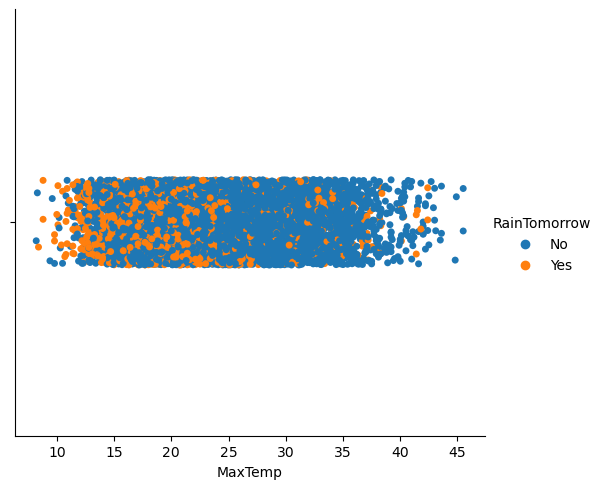

In [37]:
#Visualizing MaxTemp w.rt. the label
ax = sns.catplot(x='MaxTemp', data=df, hue='RainTomorrow')
print(df['MaxTemp'].value_counts())

Here, we can see that there is very little chance of rain for tomorrow with maximum temperature.

0.000000      5299
0.200000       406
2.805913       240
0.400000       177
0.600000       116
              ... 
61.200000        1
128.000000       1
90.000000        1
34.400000        1
40.000000        1
Name: Rainfall, Length: 251, dtype: int64


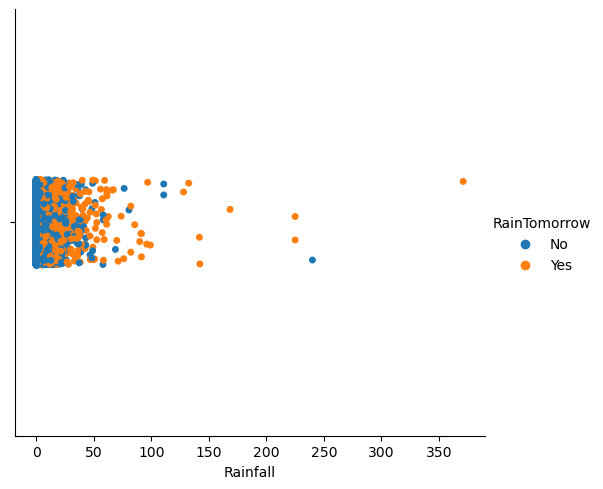

In [38]:
#Visualizing Rainfall w.rt. the label
ax = sns.catplot(x='Rainfall', data=df, hue='RainTomorrow')
print(df['Rainfall'].value_counts())

With more amount of rainfall the chances of rain for tomorrow is higher.

5.389395     3512
4.000000      180
3.000000      163
2.400000      147
2.200000      146
             ... 
17.000000       1
14.000000       1
15.000000       1
15.600000       1
0.700000        1
Name: Evaporation, Length: 117, dtype: int64


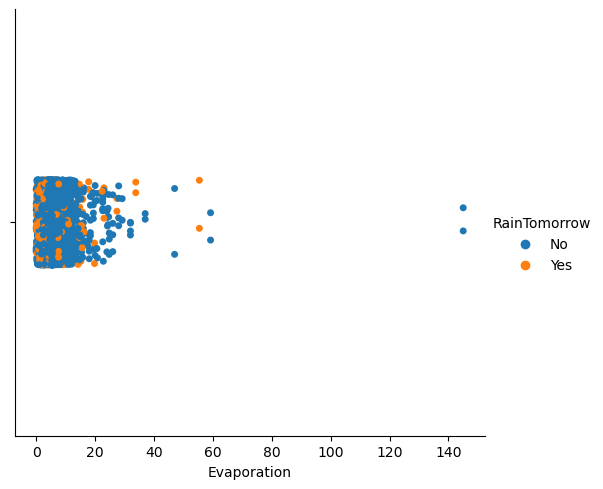

In [39]:
#Visualizing Evaporation w.rt. the label
ax = sns.catplot(x='Evaporation', data=df, hue='RainTomorrow')
print(df['Evaporation'].value_counts())

No significant effect here.

7.632205     3994
0.000000      166
11.100000      68
11.200000      67
11.000000      66
             ... 
2.500000        8
13.600000       7
13.800000       4
13.900000       3
13.500000       2
Name: Sunshine, Length: 141, dtype: int64


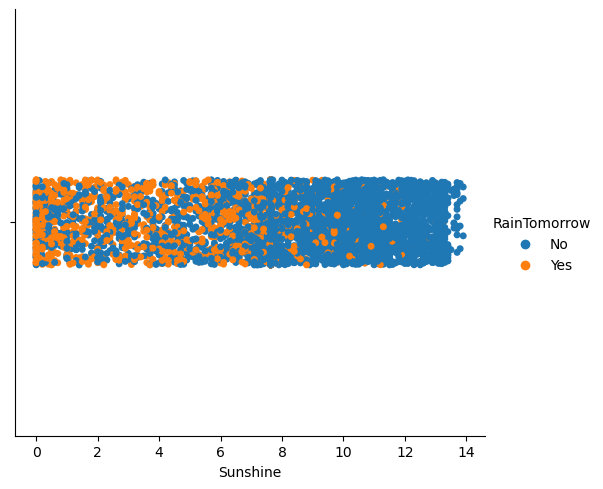

In [40]:
#Visualizing Sunshine w.rt. the label
ax = sns.catplot(x='Sunshine', data=df, hue='RainTomorrow')
print(df['Sunshine'].value_counts())

With more number of hours of bright sunshine in the day the chances for rain tomorrow is lesser.

40.174469     991
39.000000     441
35.000000     435
37.000000     422
33.000000     408
31.000000     396
41.000000     371
30.000000     367
28.000000     332
43.000000     302
48.000000     292
26.000000     275
50.000000     259
46.000000     258
24.000000     255
52.000000     249
44.000000     241
22.000000     223
54.000000     210
20.000000     186
56.000000     153
57.000000     148
19.000000     137
61.000000     114
59.000000     113
63.000000      95
17.000000      92
65.000000      74
67.000000      64
72.000000      62
15.000000      58
13.000000      57
74.000000      54
70.000000      53
69.000000      49
76.000000      44
78.000000      23
80.000000      22
11.000000      18
85.000000      14
81.000000      13
91.000000      12
89.000000       7
93.000000       7
9.000000        6
83.000000       6
98.000000       4
94.000000       3
87.000000       3
102.000000      2
100.000000      2
7.000000        2
107.000000      1
Name: WindGustSpeed, dtype: int64


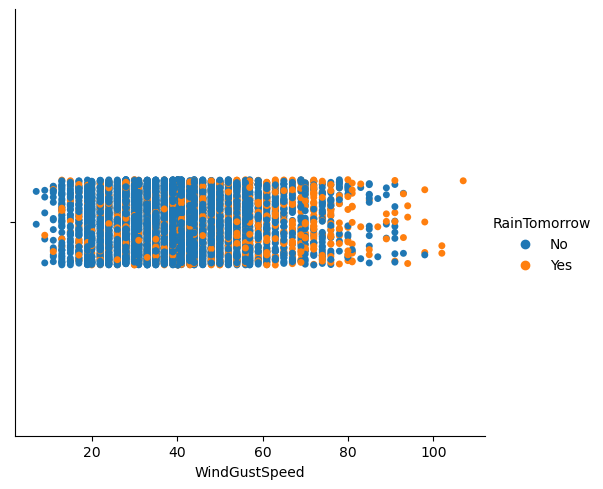

In [41]:
#Visualizing WindGustSpeed w.rt. the label
ax = sns.catplot(x='WindGustSpeed', data=df, hue='RainTomorrow')
print(df['WindGustSpeed'].value_counts())

More strong the wind gust more is the chances of rain for tomorrow.

9.000000     803
0.000000     752
13.000000    708
4.000000     610
11.000000    607
7.000000     572
6.000000     515
17.000000    481
15.000000    467
19.000000    430
20.000000    427
24.000000    312
22.000000    279
2.000000     258
28.000000    229
26.000000    208
31.000000    153
30.000000    114
35.000000     77
13.847646     76
33.000000     70
37.000000     58
41.000000     49
39.000000     35
44.000000     29
43.000000     28
46.000000     26
52.000000     16
50.000000     10
56.000000      8
54.000000      6
48.000000      6
61.000000      2
57.000000      2
63.000000      2
Name: WindSpeed9am, dtype: int64


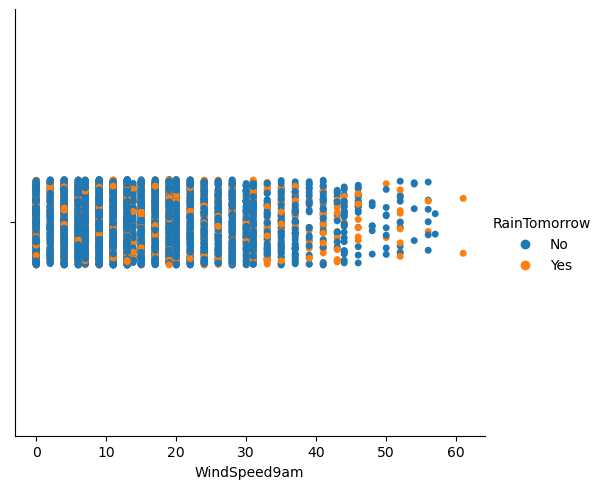

In [42]:
#Visualizing WindSpeed9am w.rt. the label
ax = sns.catplot(x='WindSpeed9am', data=df, hue='RainTomorrow')
print(df['WindSpeed9am'].value_counts())

Wind speed at 9am cannot determine whether it will rain tomorrow or not.

9.000000     724
19.000000    639
13.000000    599
20.000000    594
17.000000    555
11.000000    534
15.000000    524
24.000000    511
28.000000    458
22.000000    457
26.000000    378
7.000000     331
4.000000     287
30.000000    279
31.000000    266
6.000000     240
0.000000     199
33.000000    170
35.000000    137
37.000000    125
18.533662    107
39.000000     80
2.000000      58
41.000000     45
43.000000     34
46.000000     29
44.000000     18
50.000000     12
48.000000     11
52.000000      9
56.000000      7
54.000000      2
61.000000      2
57.000000      2
65.000000      1
83.000000      1
Name: WindSpeed3pm, dtype: int64


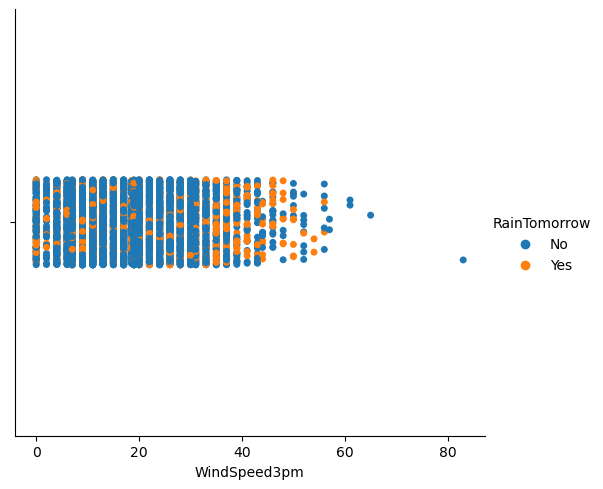

In [43]:
#Visualizing WindSpeed3pm w.rt. the label
ax = sns.catplot(x='WindSpeed3pm', data=df, hue='RainTomorrow')
print(df['WindSpeed3pm'].value_counts())

More the wind speed at 3pm more is the probability of rainfall.

73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
       ... 
17.0      2
14.0      2
11.0      2
10.0      1
15.0      1
Name: Humidity9am, Length: 91, dtype: int64


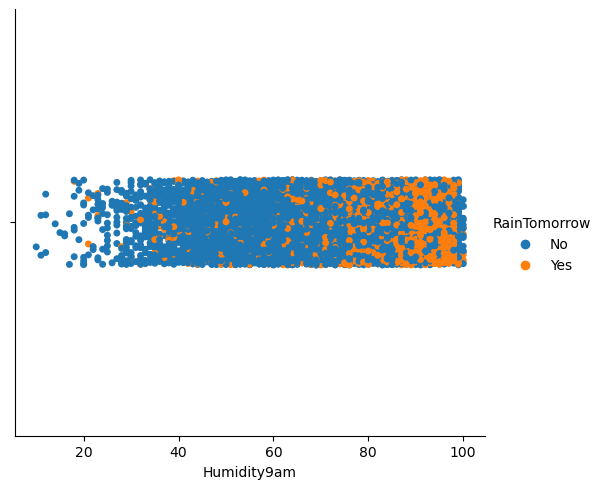

In [44]:
#Visualizing Humidity9am w.rt. the label
ax = sns.catplot(x='Humidity9am', data=df, hue='RainTomorrow')
print(df['Humidity9am'].value_counts())

More the humidity at 9am more is the chances of rainfall for today and not for tomorrow.

55.0    195
51.0    194
48.0    194
54.0    193
46.0    193
       ... 
8.0      11
7.0       9
98.0      7
99.0      3
6.0       3
Name: Humidity3pm, Length: 95, dtype: int64


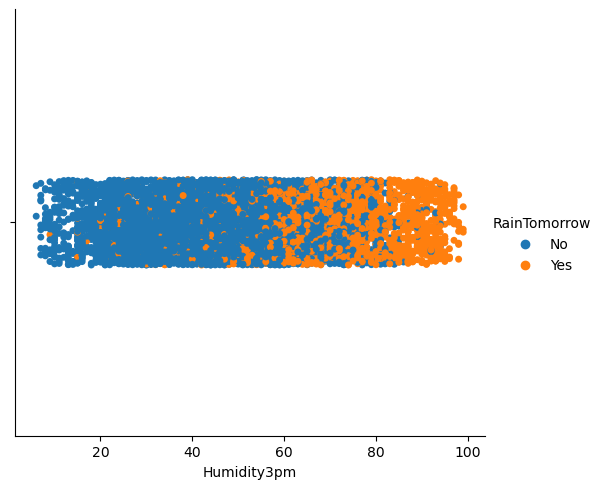

In [45]:
#Visualizing Humidity3pm w.rt. the label
ax = sns.catplot(x='Humidity3pm', data=df, hue='RainTomorrow')
print(df['Humidity3pm'].value_counts())

More the humidity at 3pm more is the chances of rainfall for tomorrow.

1017.640233    1309
1014.800000      58
1019.200000      55
1016.100000      54
1019.600000      53
               ... 
1037.300000       1
997.800000        1
1036.900000       1
1036.300000       1
1033.600000       1
Name: Pressure9am, Length: 385, dtype: int64


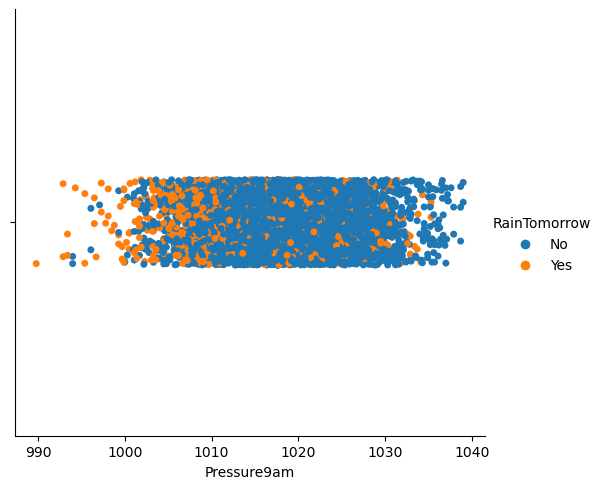

In [46]:
#Visualizing Pressure9am w.rt. the label
ax = sns.catplot(x='Pressure9am', data=df, hue='RainTomorrow')
print(df['Pressure9am'].value_counts())

With high pressure at 9am the probability of rainfall is minimum.

1015.236075    1312
1017.800000      60
1018.000000      57
1017.900000      53
1019.800000      53
               ... 
982.900000        1
994.300000        1
998.900000        1
1030.000000       1
1029.500000       1
Name: Pressure3pm, Length: 375, dtype: int64


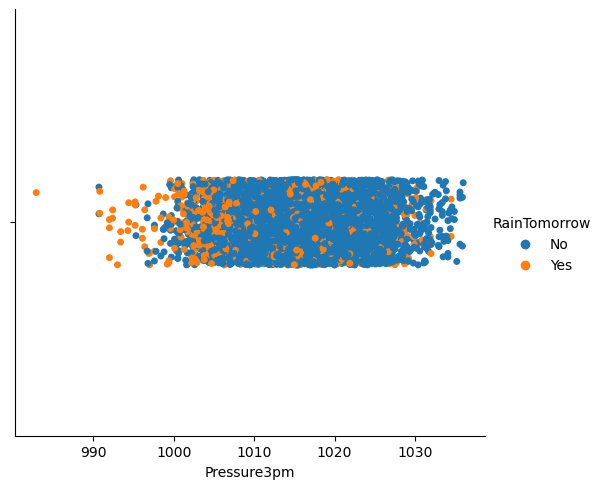

In [47]:
#Visualizing Pressure3pm w.rt. the label
ax = sns.catplot(x='Pressure3pm', data=df, hue='RainTomorrow')
print(df['Pressure3pm'].value_counts())

Here also, more the pressure at 3pm less is the chances of rainfall for tomorrow.

4.566622    2421
7.000000    1418
1.000000    1038
8.000000    1015
0.000000     554
6.000000     551
5.000000     414
3.000000     384
2.000000     357
4.000000     273
Name: Cloud9am, dtype: int64


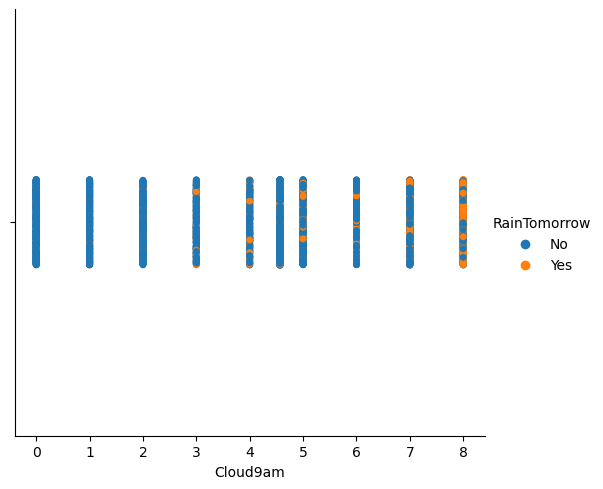

In [48]:
#Visualizing Cloud9am w.rt. the label
ax = sns.catplot(x='Cloud9am', data=df, hue='RainTomorrow')
print(df['Cloud9am'].value_counts())

More the clouds at 9am more is the chances of rain but not tomorrow.

4.503183    2455
7.000000    1294
1.000000    1077
8.000000     863
6.000000     597
5.000000     522
2.000000     508
3.000000     411
4.000000     351
0.000000     347
Name: Cloud3pm, dtype: int64


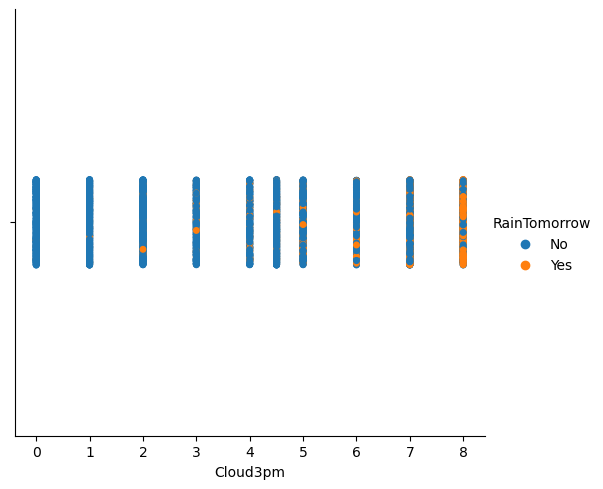

In [49]:
#Visualizing Cloud3pm w.rt. the label
ax = sns.catplot(x='Cloud3pm', data=df, hue='RainTomorrow')
print(df['Cloud3pm'].value_counts())

More the clouds at 3pm more the chances of rainfall for tomorrow.

14.8    77
18.0    73
18.3    71
17.5    69
20.6    68
        ..
2.5      1
2.0      1
3.4      1
5.2      1
30.2     1
Name: Temp9am, Length: 305, dtype: int64


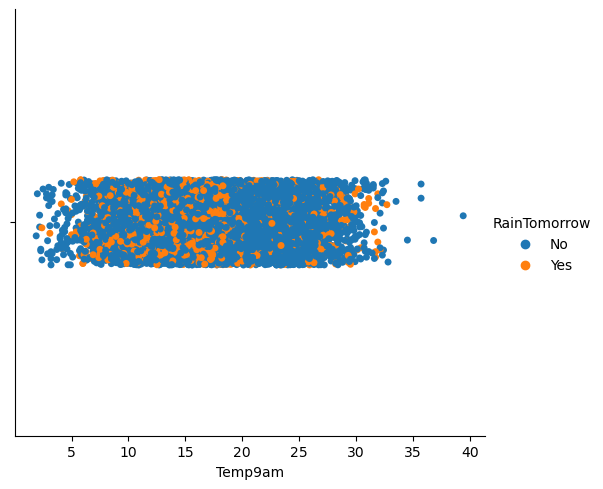

In [50]:
#Visualizing Temp9am w.rt. the label
ax = sns.catplot(x='Temp9am', data=df, hue='RainTomorrow')
print(df['Temp9am'].value_counts())

When the temperature is lower at 9am there is a chance of rainfall but not for tomorrow.

22.442934    96
19.200000    78
22.500000    77
19.000000    75
21.700000    72
             ..
8.700000      1
37.400000     1
36.700000     1
8.600000      1
42.400000     1
Name: Temp3pm, Length: 329, dtype: int64


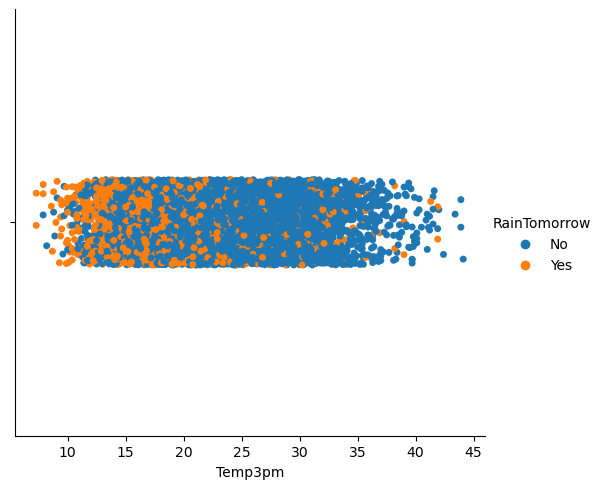

In [51]:
#Visualizing Temp3pm w.rt. the label
ax = sns.catplot(x='Temp3pm', data=df, hue='RainTomorrow')
print(df['Temp3pm'].value_counts())

Lower the temperature at 3pm more the chances of rainfall for tomorrow.

### Multivariate Analysis

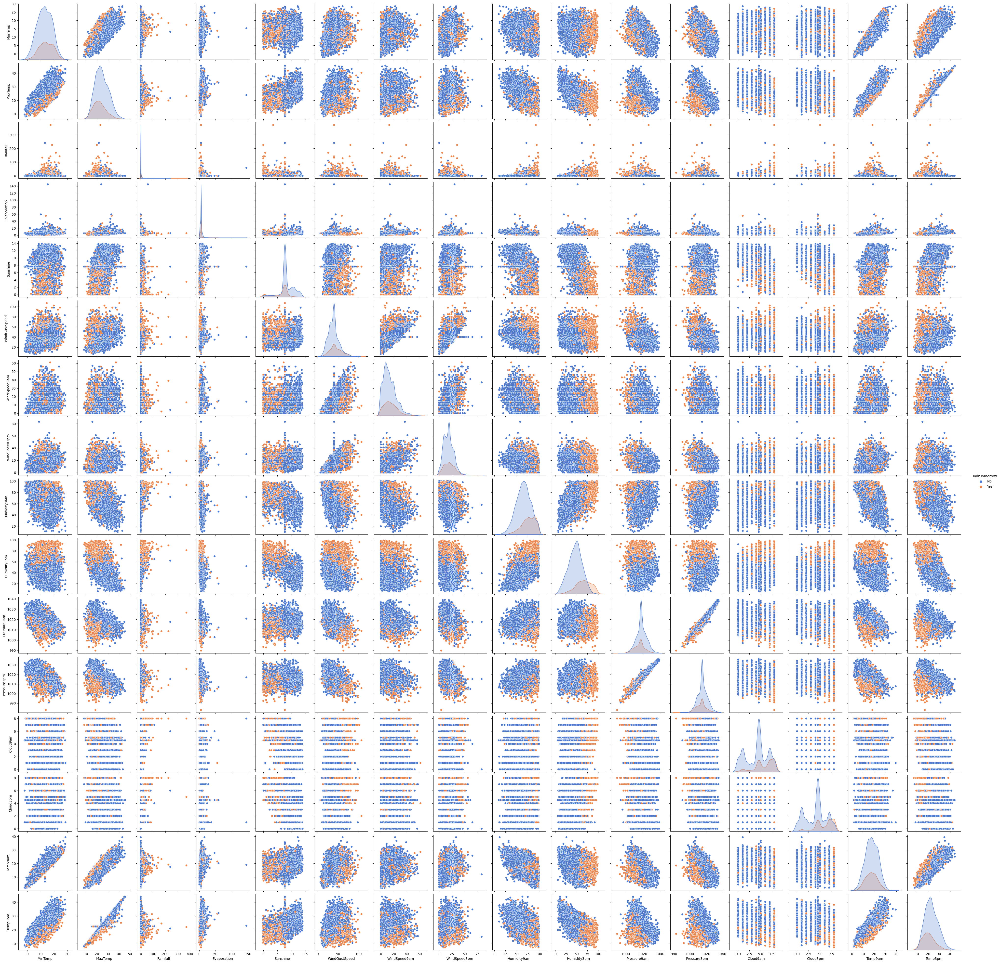

In [53]:
sns.pairplot(df, hue='RainTomorrow', palette='muted')
plt.show()

The above pairplot is somewhat confusing but we can see distribution plot on the diagonal and there are so much outliers present here. 

### Checking for Outliers

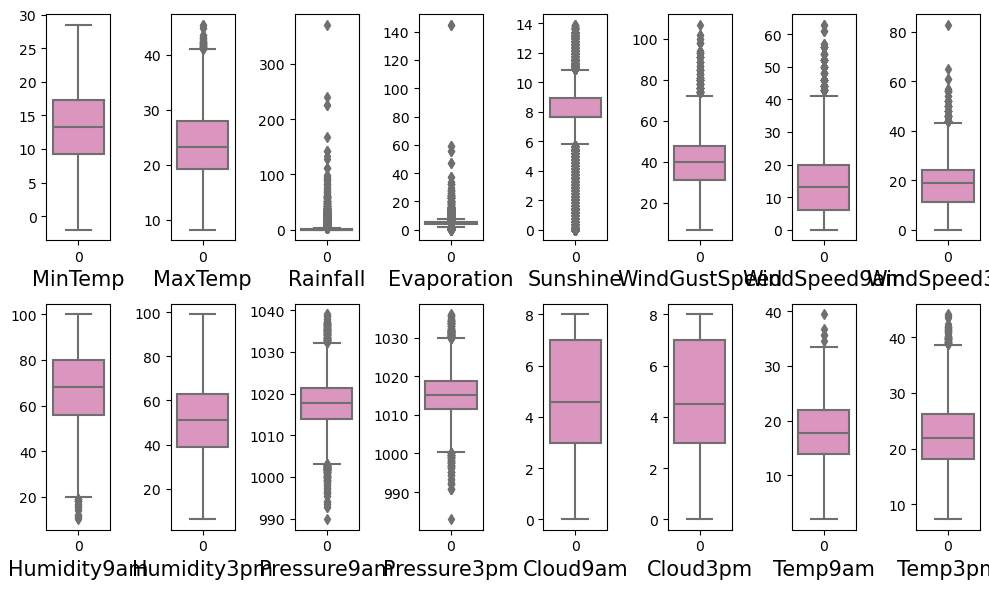

In [55]:
#Checking for outliers by box plot
plt.figure(figsize= (10, 6), facecolor="white")
plotnumber=1
for col in num_col:
    if plotnumber<=16:
        ax = plt.subplot(2,8,plotnumber)
        sns.boxplot(df[col], palette = "Set2_r")
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
plt.tight_layout()    

From the above boxplot we can notice some outliers present in MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity, Pressure9am, Pressure3pm, Temp9am and Temp3pm.
We have to remove these outliers.

Before that let's encode the categorical columns into numerical using Ordinal Encoder.

### Ordinal Encoder

In [7]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1, 1))
df        

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
2008-12-02,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2008-12-03,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
2008-12-04,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
2008-12-05,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
2017-06-22,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
2017-06-23,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0


Now we have successfully encoded all the columns. But before applying Zscore or IQR techniques let's fill the nulls in the categorical data.

In [57]:
#Checking for nulls
df.isna().sum()

Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
dtype: int64

In [8]:
#Filling nulls in categorical columns
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].median())

df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].median())

df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].median())

df['RainToday'] = df['RainToday'].fillna(df['RainToday'].median())

df['RainTomorrow'] = df['RainTomorrow'].fillna(df['RainTomorrow'].median())

In [9]:
#Let's check
df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

We have successfully filled all the nulls. Let's go ahead.

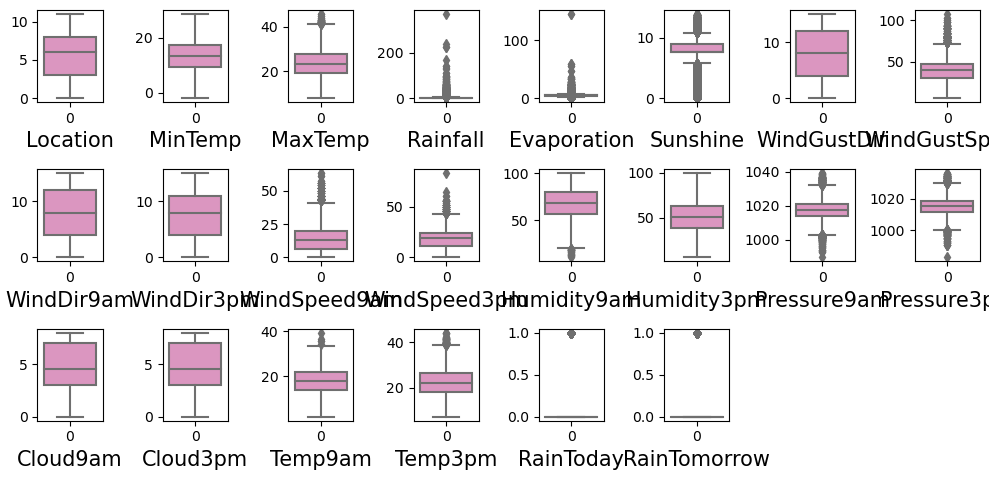

In [64]:
#Let's check for outliers again
plt.figure(figsize= (10, 6), facecolor="white")
plotnumber=1
for col in df:
    if plotnumber<=22:
        ax = plt.subplot(4,8,plotnumber)
        sns.boxplot(df[col], palette = "Set2_r")
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
plt.tight_layout()    

Here, we notice that there are outliers present in RainToday and RainTomorrow. Let's deal with them. 

### Z Score Method

In [10]:
#Applying Z Score technique to remove outliers
from scipy.stats import zscore
import numpy as np

out_features = df[['MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']]
z = np.abs(zscore(df))
z.shape

(8425, 22)

In [11]:
threshold = 3
print(np.where(z>3))

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
         62,   62,   67,   68,   68,  123,  267,  296,  381,  381,  405,
        406,  407,  407,  431,  462,  563,  568,  568,  569,  602,  683,
        683,  699,  713,  748,  748,  770,  796,  797,  802,  928,  935,
        949,  979,  980,  980,  980, 1008, 1009, 1011, 1138, 1148, 1149,
       1151, 1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412,
       1413, 1479, 1480, 1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673,
       1680, 1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2063,
       2074, 2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429,
       2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827,
       2835, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883, 2890, 2891,
       2897, 2898, 2900, 2901, 2905, 2909, 2911, 2919, 2925, 2933, 2939,
       2947, 2953, 2961, 2967, 2975, 2989, 3003, 3051, 3051, 3058, 3059,
       3059, 3060, 3066, 3067, 3067, 3067, 3068, 3

In [12]:
z.iloc[44,7]

0.08525913068003044

In [13]:
#Removing the data above Zscore and creating new df
df1= df[(z<3).all(axis=1)]
df1.shape

(7987, 22)

In [14]:
#Shape of old and new dataframe
print('Shape of Old dataframe :', df.shape)
print('Shape of New dataframe :', df1.shape)

Shape of Old dataframe : (8425, 22)
Shape of New dataframe : (7987, 22)


In [15]:
print("Data Loss Percentage :", ((df.shape[0]-df1.shape[0])/df.shape[0])*100)

Data Loss Percentage : 5.198813056379822


Here, we got 5% data loss which is acceptable.

In [16]:
df=df1

### IQR Method

In [73]:
#Let's find more outliers by IQR Method
#1st quantile
Q1 = out_features.quantile(0.25)

#3rd quantile
Q3 = out_features.quantile(0.75)

#IQR
IQR = Q3 - Q1

df2 = df[~((df < (Q1 - 1.5 * IQR))| (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [74]:
df2.shape

(3279, 22)

In [75]:
print("Data Loss Percentage after removing outliers with IQR method :", ((df.shape[0]-df2.shape[0])/df.shape[0])*100)

Data Loss Percentage after removing outliers with IQR method : 58.94578690371854


That's too much data loss. We can't accept it.

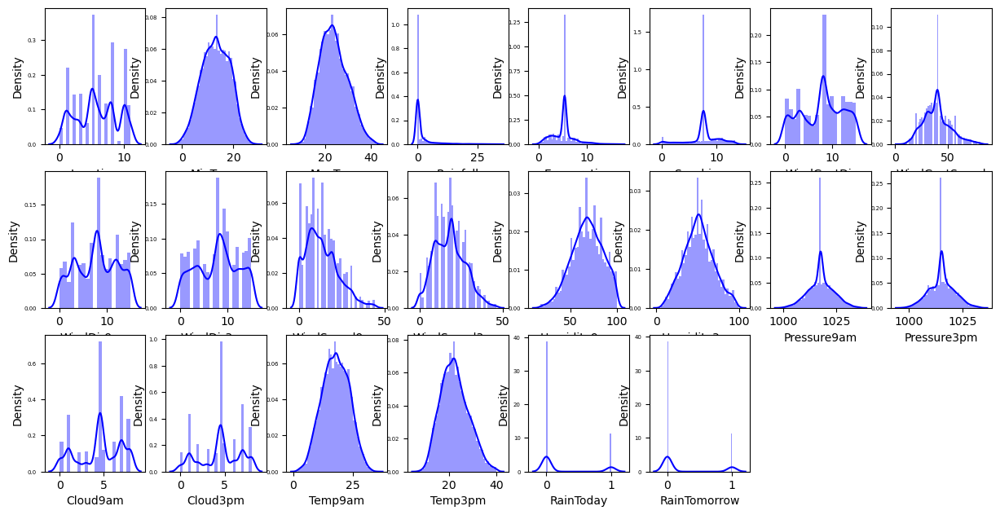

In [78]:
#Checking how data is distributed in each column
plt.figure(figsize=(15, 10), facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=22:
        ax = plt.subplot(4,8, plotnumber)
        sns.distplot(df[column], color='b')
        plt.xlabel(column, fontsize=10)
        plt.yticks(rotation=0, fontsize=5)
    plotnumber+=1
plt.show()    

The data looks more normal than before. Let's go further.

### Checking for correlation

In [17]:
#Let's see the correlation between features and label
cor = df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.116694,0.063798,0.022192,0.132245,0.048579,-0.022601,0.245658,-0.067011,-0.031490,...,0.003725,0.059978,-0.024265,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222
MinTemp,0.116694,1.000000,0.718598,0.093118,0.372576,0.065682,-0.166130,0.231097,-0.094252,-0.151746,...,-0.126383,0.090208,-0.433113,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021
MaxTemp,0.063798,0.718598,1.000000,-0.138415,0.468786,0.387050,-0.248034,0.136337,-0.250219,-0.187851,...,-0.382687,-0.409560,-0.333569,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708
Rainfall,0.022192,0.093118,-0.138415,1.000000,-0.095749,-0.166857,0.092458,0.093945,0.130755,0.074880,...,0.297041,0.290501,-0.105009,-0.043905,0.224696,0.188755,-0.033343,-0.146935,0.689452,0.270580
Evaporation,0.132245,0.372576,0.468786,-0.095749,1.000000,0.369080,-0.115694,0.200769,-0.120968,-0.037185,...,-0.325325,-0.231465,-0.262043,-0.275720,-0.116113,-0.146421,0.439628,0.454352,-0.163847,-0.089365
Sunshine,0.048579,0.065682,0.387050,-0.166857,0.369080,1.000000,-0.108849,0.009797,-0.085793,-0.069040,...,-0.366337,-0.437504,-0.004078,-0.063832,-0.527350,-0.541996,0.261680,0.403489,-0.219089,-0.317675
WindGustDir,-0.022601,-0.166130,-0.248034,0.092458,-0.115694,-0.108849,1.000000,0.014422,0.404089,0.545012,...,0.065593,0.078485,-0.105117,-0.015171,0.104707,0.089161,-0.195156,-0.259699,0.125947,0.045186
WindGustSpeed,0.245658,0.231097,0.136337,0.093945,0.200769,0.009797,0.014422,1.000000,-0.123293,0.078202,...,-0.263933,-0.085009,-0.377284,-0.336132,0.013678,0.064375,0.198936,0.101786,0.076677,0.181478
WindDir9am,-0.067011,-0.094252,-0.250219,0.130755,-0.120968,-0.085793,0.404089,-0.123293,1.000000,0.260714,...,0.094001,0.147317,0.018165,0.105255,0.109311,0.070037,-0.158292,-0.254412,0.156452,0.024219
WindDir3pm,-0.031490,-0.151746,-0.187851,0.074880,-0.037185,-0.069040,0.545012,0.078202,0.260714,1.000000,...,-0.013207,-0.013628,-0.129795,-0.036935,0.073575,0.052028,-0.168738,-0.199768,0.100286,0.002589


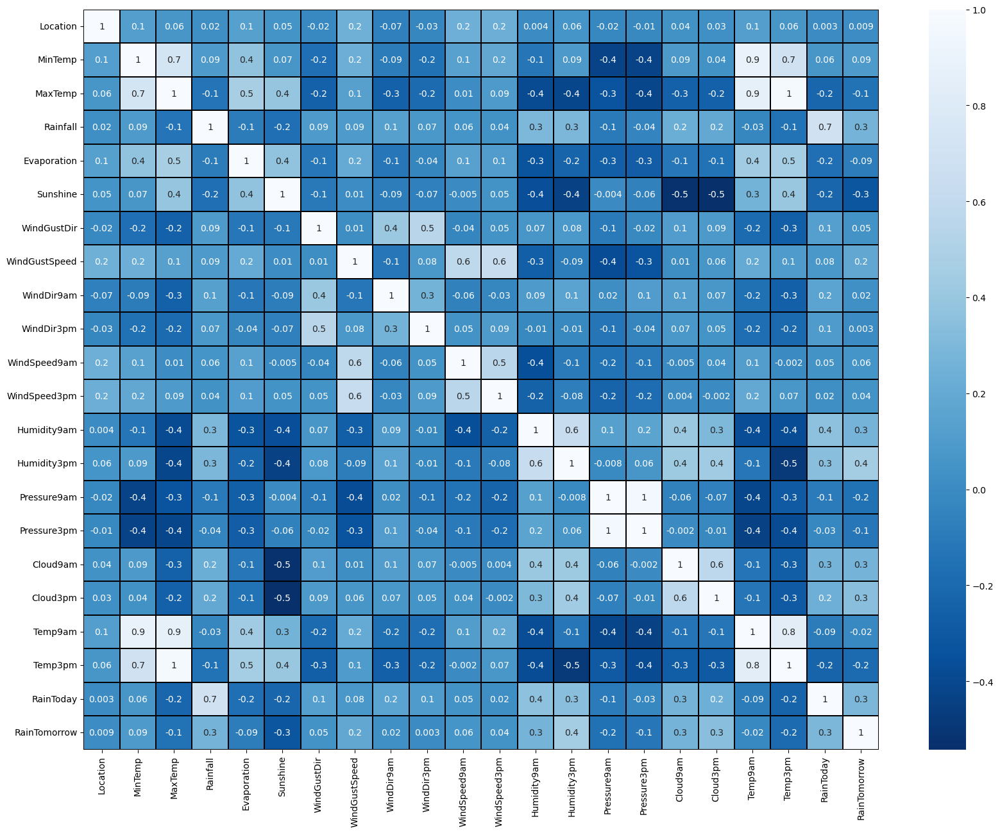

In [80]:
#Visualizing correlation by plotting a heatmap
plt.figure(figsize = (20, 15))
sns.heatmap(df.corr(), linewidths = 0.1, fmt=".1g", linecolor = "black", annot = True, cmap = "Blues_r")
plt.yticks(rotation=0)
plt.show()

From the above heatmap we can notice:
- some positive as well as negative correlations between features and label.
- there are 14 positive correlations and 6 negative correlations between features and label.
- the label is positively correlated with Location, MinTemp, Rainfall, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Cloud9am, CLoud3pm and RainToday.
- the label has negative correlations with MaxTemp, Evaporation, Sunshine, Pressure9am, Pressure3pm, Temp9am and Temp3pm. 

In [81]:
cor['RainTomorrow'].sort_values(ascending = False)

RainTomorrow     1.000000
Humidity3pm      0.445891
Cloud3pm         0.337922
RainToday        0.294528
Rainfall         0.270580
Humidity9am      0.269722
Cloud9am         0.269598
WindGustSpeed    0.181478
MinTemp          0.091021
WindSpeed9am     0.057933
WindGustDir      0.045186
WindSpeed3pm     0.042472
WindDir9am       0.024219
Location         0.009222
WindDir3pm       0.002589
Temp9am         -0.021459
Evaporation     -0.089365
Pressure3pm     -0.124953
MaxTemp         -0.149708
Pressure9am     -0.152692
Temp3pm         -0.191706
Sunshine        -0.317675
Name: RainTomorrow, dtype: float64

Here we can see that the label has 44% correlation with Humidity3pm.

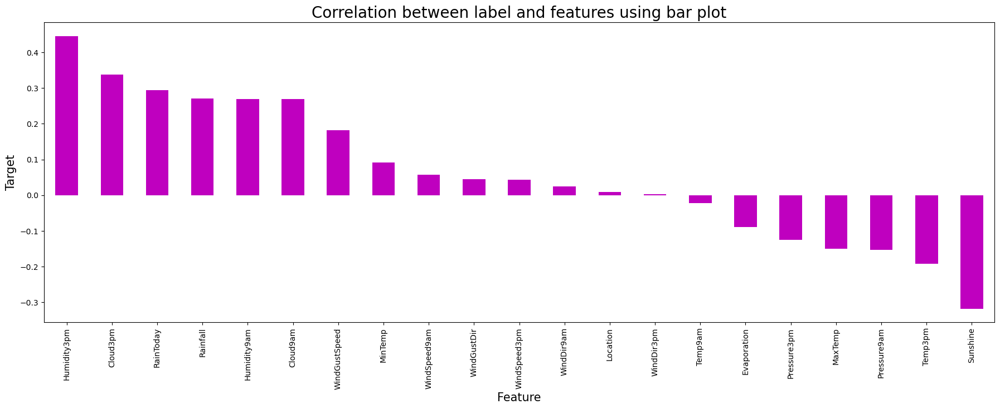

In [83]:
#Visualizing the correlation using bar plot
plt.figure(figsize = (22,7))
df.corr()['RainTomorrow'].sort_values(ascending = False).drop(['RainTomorrow']).plot(kind='bar', color='m')
plt.xlabel('Feature', fontsize=15)
plt.ylabel('Target', fontsize=15)
plt.title("Correlation between label and features using bar plot", fontsize=20)
plt.show()

Again here we see Humidity3pm has high correlation with the label but it is moderate correlation not very strong so we do not need to remove it.

Let's proceed ahead and check for skewness.

### Checking for skewness

In [18]:
df.skew()

Location        -0.040284
MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.488446
Evaporation      0.846181
Sunshine        -0.723970
WindGustDir     -0.166236
WindGustSpeed    0.506897
WindDir9am      -0.067616
WindDir3pm      -0.101784
WindSpeed9am     0.711395
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

Here we can notice skewness in Rainfall, Evaporation, WindSpeed9am, RainToday and RainTomorrow. Let's use transformation methods to reduce the skewness.

In [19]:
#Removing skewness 
df['Rainfall'] = np.cbrt(df['Rainfall'])

df['Evaporation'] = np.cbrt(df['Evaporation'])

df['WindSpeed9am'] = np.cbrt(df['WindSpeed9am'])

df['RainToday'] = np.cbrt(df['RainToday'])

df['RainTomorrow'] = np.cbrt(df['RainTomorrow'])

In [20]:
#Let's check
df.skew()

Location        -0.040284
MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         1.319083
Evaporation     -0.967518
Sunshine        -0.723970
WindGustDir     -0.166236
WindGustSpeed    0.506897
WindDir9am      -0.067616
WindDir3pm      -0.101784
WindSpeed9am    -1.274070
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

In [21]:
df['Rainfall'] = np.sqrt(df['Rainfall'])
df['RainToday'] = np.sqrt(df['RainToday'])
df['RainTomorrow'] = np.sqrt(df['RainTomorrow'])

In [22]:
df.skew()

Location        -0.040284
MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         0.805356
Evaporation     -0.967518
Sunshine        -0.723970
WindGustDir     -0.166236
WindGustSpeed    0.506897
WindDir9am      -0.067616
WindDir3pm      -0.101784
WindSpeed9am    -1.274070
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

In [23]:
df['Rainfall'] = np.sqrt(df['Rainfall'])
df['RainToday'] = np.sqrt(df['RainToday'])
df['RainTomorrow'] = np.sqrt(df['RainTomorrow'])

In [24]:
df.skew()

Location        -0.040284
MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         0.628743
Evaporation     -0.967518
Sunshine        -0.723970
WindGustDir     -0.166236
WindGustSpeed    0.506897
WindDir9am      -0.067616
WindDir3pm      -0.101784
WindSpeed9am    -1.274070
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

We have successfully removed the skews. Let's proceed ahead.

### Separating features and label

In [25]:
x = df.drop("RainTomorrow", axis=1)
y = df["RainTomorrow"]

### Scaling features using Standard Scaler

In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.508427,0.056444,-0.145732,1.075603,0.255563,-0.013374,1.168336,0.364103,1.199868,1.410700,...,0.638072,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476
1,-1.508427,-1.058476,0.220676,-0.749794,0.255563,-0.013374,1.393511,0.364103,-0.408924,1.637392,...,0.421555,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476
2,-1.508427,-0.036466,0.320605,-0.749794,0.255563,-0.013374,1.618687,0.520531,1.199868,1.637392,...,0.854590,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476
3,-1.508427,-0.724000,0.703668,-0.749794,0.255563,-0.013374,-0.858244,-1.200173,0.280558,-1.762985,...,-0.985811,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476
4,-1.508427,0.818306,1.419829,1.154985,0.255563,-0.013374,1.168336,0.129462,-1.558061,-0.176142,...,0.205037,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913248,-0.062457,-0.749794,0.255563,-0.013374,-1.758946,-0.652677,0.280558,-1.536293,...,-0.769293,-1.030114,-1.513226,1.137532,0.829435,0.011773,0.013138,-1.358595,0.004208,-0.542476
7983,1.029423,-1.764592,0.253986,-0.749794,0.255563,-0.013374,-0.407893,-1.356601,0.280558,-1.082910,...,-0.985811,-0.726555,-1.679648,0.953678,0.626930,0.011773,0.013138,-1.215007,0.364014,-0.542476
7984,1.029423,-1.430116,0.520464,-0.749794,0.255563,-0.013374,-1.083419,-0.183394,0.280558,1.410700,...,-0.985811,-0.908690,-1.513226,0.535827,0.238796,0.011773,0.013138,-0.927832,0.638152,-0.542476
7985,1.029423,-0.984148,0.537119,-0.749794,0.255563,-0.013374,0.267634,-0.887318,0.510385,-1.082910,...,-1.202329,-1.030114,-1.513226,0.268402,0.188170,-0.633229,-1.076661,-0.461172,0.621019,-0.542476


We have scaled the features to reduce biasness.

### Checking for VIF

In [27]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values, i)
                    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF Values,Features
0,1.163335,Location
1,8.322866,MinTemp
2,26.285332,MaxTemp
3,2.938190,Rainfall
4,1.527709,Evaporation
5,1.972920,Sunshine
6,1.657253,WindGustDir
7,2.112367,WindGustSpeed
8,1.337848,WindDir9am
9,1.541482,WindDir3pm


Here, Temp3pm has the highest VIF value. Let's drop it and see whether the VIF value of others decrease or not, if not then we will drop another one.

In [28]:
x.drop('Temp3pm', axis=1, inplace=True)
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,-1.508427,0.056444,-0.145732,1.075603,0.255563,-0.013374,1.168336,0.364103,1.199868,1.410700,0.707154,0.638072,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.542476
1,-1.508427,-1.058476,0.220676,-0.749794,0.255563,-0.013374,1.393511,0.364103,-0.408924,1.637392,-0.647365,0.421555,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.084254,-0.542476
2,-1.508427,-0.036466,0.320605,-0.749794,0.255563,-0.013374,1.618687,0.520531,1.199868,1.637392,0.651849,0.854590,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,0.597788,-0.542476
3,-1.508427,-0.724000,0.703668,-0.749794,0.255563,-0.013374,-0.858244,-1.200173,0.280558,-1.762985,0.117716,-0.985811,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,0.077282,-0.542476
4,-1.508427,0.818306,1.419829,1.154985,0.255563,-0.013374,1.168336,0.129462,-1.558061,-0.176142,-0.256122,0.205037,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,0.023437,-0.542476


In [29]:
#Let's check again
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values, i)
                    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF Values,Features
0,1.160940,Location
1,8.250418,MinTemp
2,9.587795,MaxTemp
3,2.938115,Rainfall
4,1.526426,Evaporation
5,1.972704,Sunshine
6,1.655412,WindGustDir
7,2.102949,WindGustSpeed
8,1.337369,WindDir9am
9,1.540192,WindDir3pm


Here, Pressure9am has higher VIF value, let's drop it too and check.

In [30]:
#Dropping Pressure9am
x.drop('Pressure9am', axis=1, inplace=True)

In [31]:
#Let's check again
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values, i)
                    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF Values,Features
0,1.160593,Location
1,8.107938,MinTemp
2,9.213076,MaxTemp
3,2.927096,Rainfall
4,1.513207,Evaporation
5,1.968371,Sunshine
6,1.638495,WindGustDir
7,2.087649,WindGustSpeed
8,1.312605,WindDir9am
9,1.479281,WindDir3pm


Here, we got Temp9am with high VIF, let's drop it too as VIF >10 is not acceptable.

In [32]:
#Dropping Temp9am
x.drop('Temp9am', axis=1, inplace=True)

In [33]:
#Let's check again
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values, i)
                    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF Values,Features
0,1.148178,Location
1,4.365557,MinTemp
2,5.399934,MaxTemp
3,2.926529,Rainfall
4,1.510133,Evaporation
5,1.960871,Sunshine
6,1.635570,WindGustDir
7,2.032626,WindGustSpeed
8,1.312585,WindDir9am
9,1.478853,WindDir3pm


Everything looks good now. Let's go ahead.

In [34]:
#Checking the value count of the target column
y.value_counts()

0.0    6165
1.0    1822
Name: RainTomorrow, dtype: int64

We can see the data is imbalanced, we have to balance it otherwise it will create problems while training.

### OverSampling Method

In [35]:
#Using OverSampling method or SMOTE() to balance the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()

x,y = SM.fit_resample(x,y)   

In [36]:
#Let's check
y.value_counts()

0.0    6165
1.0    6165
Name: RainTomorrow, dtype: int64

The data is balanced successfully. Let's go ahead and train our models.

As the label contains categorical data we will use classification algorithms to train the models.

### Data Modelling

In [37]:
#Finding best random state
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train, y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
        
print("Best accuracy score is", maxAccu, "at random_state", maxRS)        

Best accuracy score is 0.9391727493917275 at random_state 95


### Creating Train Test Split

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state=maxRS)

### Classification Algorithms

In [48]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [40]:
#Checking accuracy for Random Forest Classifier
RF = RandomForestClassifier()
RF.fit(x_train, y_train)
predRF = RF.predict(x_test)
print(accuracy_score(y_test, predRF))
print(confusion_matrix(y_test, predRF))
print(classification_report(y_test, predRF))

0.9407948094079481
[[1730  132]
 [  87 1750]]
              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94      1862
         1.0       0.93      0.95      0.94      1837

    accuracy                           0.94      3699
   macro avg       0.94      0.94      0.94      3699
weighted avg       0.94      0.94      0.94      3699



In [41]:
#Logistic Regression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test, predLR))

0.7864287645309543
[[1494  368]
 [ 422 1415]]
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      1862
         1.0       0.79      0.77      0.78      1837

    accuracy                           0.79      3699
   macro avg       0.79      0.79      0.79      3699
weighted avg       0.79      0.79      0.79      3699



In [49]:
#Decision Tree
DT = DecisionTreeClassifier()
DT.fit(x_train, y_train)
predDT = DT.predict(x_test)
print(accuracy_score(y_test, predDT))
print(confusion_matrix(y_test, predDT))
print(classification_report(y_test, predDT))

0.863206271965396
[[1582  280]
 [ 226 1611]]
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86      1862
         1.0       0.85      0.88      0.86      1837

    accuracy                           0.86      3699
   macro avg       0.86      0.86      0.86      3699
weighted avg       0.86      0.86      0.86      3699



In [42]:
#SVC
svc = SVC()
svc.fit(x_train, y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test, predsvc))

0.850500135171668
[[1543  319]
 [ 234 1603]]
              precision    recall  f1-score   support

         0.0       0.87      0.83      0.85      1862
         1.0       0.83      0.87      0.85      1837

    accuracy                           0.85      3699
   macro avg       0.85      0.85      0.85      3699
weighted avg       0.85      0.85      0.85      3699



In [43]:
#Gradient Boosting
GBC = GradientBoostingClassifier()
GBC.fit(x_train, y_train)
predGBC = GBC.predict(x_test)
print(accuracy_score(y_test, predGBC))
print(confusion_matrix(y_test, predGBC))
print(classification_report(y_test, predGBC))

0.857529061908624
[[1606  256]
 [ 271 1566]]
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86      1862
         1.0       0.86      0.85      0.86      1837

    accuracy                           0.86      3699
   macro avg       0.86      0.86      0.86      3699
weighted avg       0.86      0.86      0.86      3699



In [44]:
#Ada Boost
AB = AdaBoostClassifier()
AB.fit(x_train, y_train)
predAB = AB.predict(x_test)
print(accuracy_score(y_test, predAB))
print(confusion_matrix(y_test, predAB))
print(classification_report(y_test, predAB))

0.8158961881589619
[[1533  329]
 [ 352 1485]]
              precision    recall  f1-score   support

         0.0       0.81      0.82      0.82      1862
         1.0       0.82      0.81      0.81      1837

    accuracy                           0.82      3699
   macro avg       0.82      0.82      0.82      3699
weighted avg       0.82      0.82      0.82      3699



In [45]:
#Bagging Classifier
BC = BaggingClassifier()
BC.fit(x_train, y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test, predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test, predBC))

0.9045688023790214
[[1700  162]
 [ 191 1646]]
              precision    recall  f1-score   support

         0.0       0.90      0.91      0.91      1862
         1.0       0.91      0.90      0.90      1837

    accuracy                           0.90      3699
   macro avg       0.90      0.90      0.90      3699
weighted avg       0.90      0.90      0.90      3699



In [46]:
#Extra Trees
ETC = ExtraTreesClassifier()
ETC.fit(x_train, y_train)
predETC = ETC.predict(x_test)
print(accuracy_score(y_test, predETC))
print(confusion_matrix(y_test, predETC))
print(classification_report(y_test, predETC))

0.948905109489051
[[1740  122]
 [  67 1770]]
              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95      1862
         1.0       0.94      0.96      0.95      1837

    accuracy                           0.95      3699
   macro avg       0.95      0.95      0.95      3699
weighted avg       0.95      0.95      0.95      3699



Among all the above algorithms Extra Trees Classfieir gives the best accuracy of 95%. Great!
Let's go ahead and check the cross validation scores.

### Cross Validation Score

In [50]:
#Checking cv score Random Forest Classifier
score = cross_val_score(RF,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predRF) - score.mean())

[0.74898621 0.71330089 0.8783455  0.89334955 0.83414436]
0.8136253041362531
Difference between Accuracy score and cross validation score is -  0.12716950527169502


In [51]:
#Checking cv score Logistic Regression
score = cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predLR) - score.mean())

[0.69870235 0.71532847 0.65450122 0.74614761 0.82806164]
0.7285482562854827
Difference between Accuracy score and cross validation score is -  0.05788050824547164


In [52]:
#Checking cv score Decision Tree Classifier
score = cross_val_score(DT,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predDT) - score.mean())

[0.61394972 0.69505272 0.85644769 0.84509327 0.71208435]
0.7445255474452555
Difference between Accuracy score and cross validation score is -  0.11868072452014056


In [53]:
#Checking cv score SVC
score = cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predsvc) - score.mean())

[0.74087591 0.66261152 0.73844282 0.81670722 0.81589619]
0.7549067315490673
Difference between Accuracy score and cross validation score is -  0.09559340362260071


In [54]:
#Checking cv score Gradient Boosting Classifier
score = cross_val_score(GBC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predGBC) - score.mean())

[0.62489862 0.5648824  0.73317113 0.75385239 0.68004866]
0.6713706407137063
Difference between Accuracy score and cross validation score is -  0.18615842119491766


In [55]:
#Checking cv score AdaBoost Classifier
score = cross_val_score(AB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predAB) - score.mean())

[0.61800487 0.5539335  0.67396594 0.7242498  0.73844282]
0.6617193836171938
Difference between Accuracy score and cross validation score is -  0.15417680454176808


In [56]:
#Checking cv score Bagging Classifier
score = cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predBC) - score.mean())

[0.60016221 0.70721817 0.87064071 0.84387672 0.79115977]
0.7626115166261151
Difference between Accuracy score and cross validation score is -  0.14195728575290623


In [57]:
#Checking cv score ExtraTrees Classifier
score = cross_val_score(ETC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predETC) - score.mean())

[0.77615572 0.76277372 0.89943228 0.90997567 0.83941606]
0.8375506893755069
Difference between Accuracy score and cross validation score is -  0.11135442011354413


Here, we can see that Logistic Regression gives the least difference of 5% between accuracy and cross validation score. So we will go with Logistic Regression and tune the parameters to increase the scores.

### Hyper parameter Tuning

In [59]:
from sklearn.model_selection import GridSearchCV

In [63]:
#Logistic Regression
parameters = {'penalty': ['l1', 'l2', 'elasticnet', 'None'],
             'fit_intercept': [True, False],
             'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'saga'],
             'multi_class': ['auto', 'ovr', 'multinomial']}

In [64]:
grid = GridSearchCV(LogisticRegression(), parameters, cv=5)

In [65]:
grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'fit_intercept': [True, False],
                         'multi_class': ['auto', 'ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet', 'None'],
                         'solver': ['lbfgs', 'liblinear', 'newton-cg',
                                    'newton-cholesky', 'saga']})

In [66]:
grid.best_params_

{'fit_intercept': True,
 'multi_class': 'auto',
 'penalty': 'l1',
 'solver': 'liblinear'}

In [73]:
final_model = LogisticRegression(fit_intercept = True,
                                multi_class = 'auto',
                                penalty = 'l1',
                                solver = 'liblinear')
final_model.fit(x_train, y_train)
pred = final_model.predict(x_test)
acc = accuracy_score(y_test, pred)
print(acc*100)

78.69694512030279


We got 78% accuracy in this model. Let's save it.

### Saving the Model

In [74]:
import pickle

filename = 'Rain_Tomorrow.pkl'
pickle.dump(final_model, open(filename, 'wb'))

In [75]:
loaded_model = pickle.load(open ('Rain_Tomorrow.pkl','rb'))
result = loaded_model.score(x_test, y_test)
print(result*100)

78.69694512030279


In [76]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:], y_test[:]], index=["Predicted", "Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,3689,3690,3691,3692,3693,3694,3695,3696,3697,3698
Predicted,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
Original,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


Done for RainTomorrow!

### For RainToday

As we have done everything in the previous prediction, we will start from data visualization.

#### Univariate Analysis

0.0    6171
1.0    1816
Name: RainToday, dtype: int64


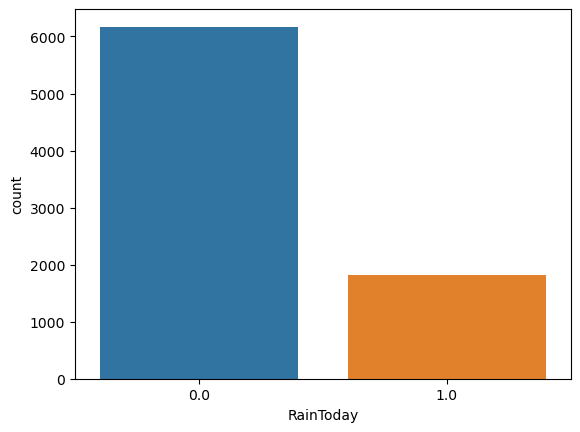

In [77]:
#Visualizing the label
ax = sns.countplot(x='RainToday', data=df)
print(df['RainToday'].value_counts())

Here, 0 means 'YES' and 1 means 'NO' that means the chances of rain for today is much more.

#### Bivariate Analysis

 12.000000    73
 13.193305    72
 13.200000    69
 12.700000    64
 13.800000    64
              ..
 1.400000      1
-1.200000      1
 0.300000      1
-1.400000      1
 26.000000     1
Name: MinTemp, Length: 283, dtype: int64


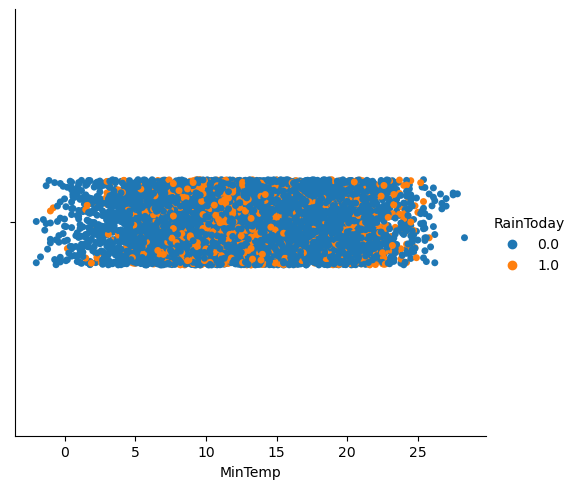

In [78]:
#Visualizing MinTemp w.rt. the label
ax = sns.catplot(x='MinTemp', data=df, hue='RainToday')
print(df['MinTemp'].value_counts())

With minimum temperature the chances of rain for today is more.

19.0    79
23.8    70
19.8    67
25.0    66
20.0    65
        ..
40.9     1
41.2     1
41.5     1
11.2     1
39.4     1
Name: MaxTemp, Length: 320, dtype: int64


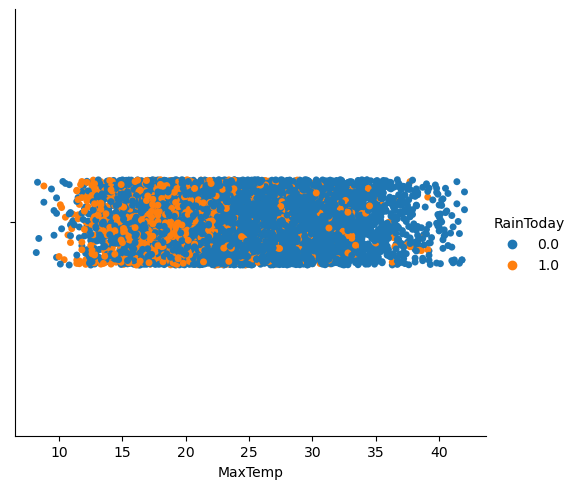

In [79]:
#Visualizing MaxTemp w.rt. the label
ax = sns.catplot(x='MaxTemp', data=df, hue='RainToday')
print(df['MaxTemp'].value_counts())

With maximum temperature there is a little chance of rain for today.

0.000000    5071
0.874485     390
1.089782     232
0.926485     176
0.958325     115
            ... 
1.325447       1
1.326940       1
1.306785       1
1.337589       1
1.315259       1
Name: Rainfall, Length: 171, dtype: int64


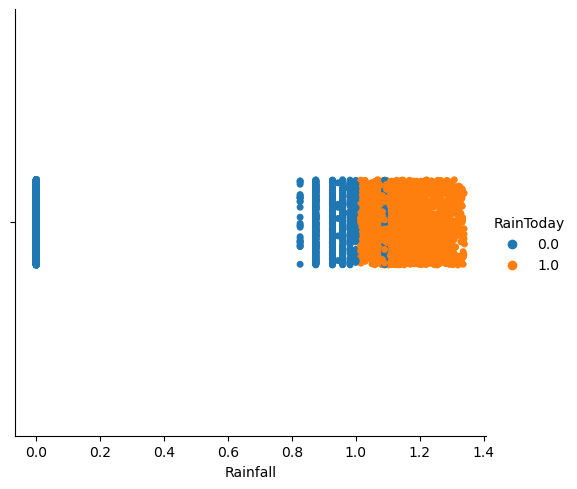

In [80]:
#Visualizing Rainfall w.rt. the label
ax = sns.catplot(x='Rainfall', data=df, hue='RainToday')
print(df['Rainfall'].value_counts())

1.753261    3364
1.587401     175
1.442250     158
1.300591     141
1.409460     138
            ... 
2.432881       3
2.550954       2
2.410142       1
2.466212       1
0.887904       1
Name: Evaporation, Length: 84, dtype: int64


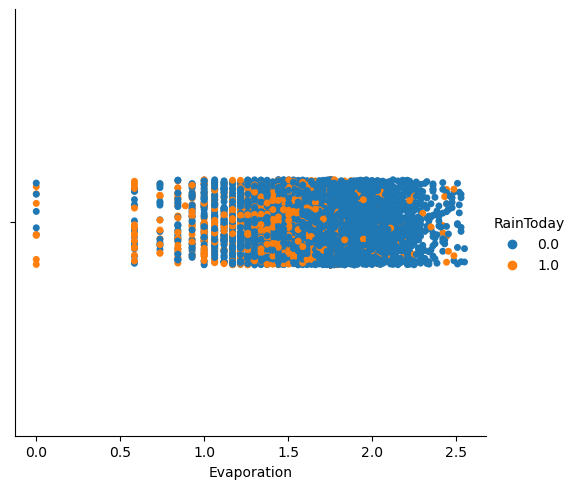

In [81]:
#Visualizing Evaporation w.rt. the label
ax = sns.catplot(x='Evaporation', data=df, hue='RainToday')
print(df['Evaporation'].value_counts())

With high amount of evaporation the chances of rain is more.

7.632205     3801
0.000000      147
11.200000      67
11.000000      66
11.100000      66
             ... 
2.500000        8
13.600000       5
13.800000       4
13.900000       3
13.500000       2
Name: Sunshine, Length: 141, dtype: int64


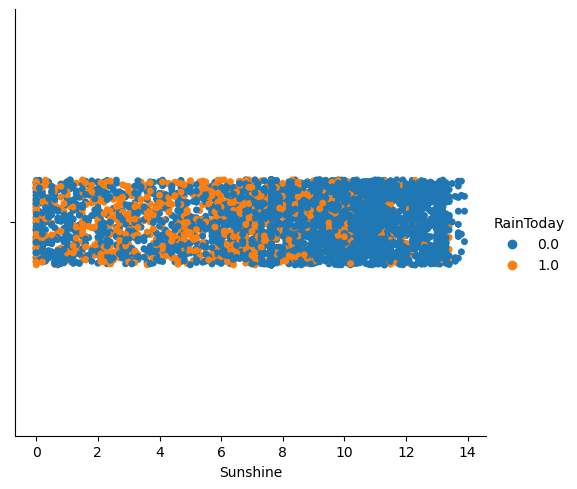

In [82]:
#Visualizing Sunshine w.rt. the label
ax = sns.catplot(x='Sunshine', data=df, hue='RainToday')
print(df['Sunshine'].value_counts())

With more hours of Sunshine there is a little chance of rain for today.

40.174469    944
39.000000    422
35.000000    417
37.000000    405
33.000000    393
31.000000    387
41.000000    364
30.000000    364
28.000000    323
43.000000    290
48.000000    286
26.000000    268
24.000000    255
50.000000    253
46.000000    247
52.000000    237
44.000000    227
22.000000    221
54.000000    199
20.000000    180
57.000000    144
56.000000    143
19.000000    132
59.000000    105
61.000000     95
17.000000     92
63.000000     82
65.000000     68
67.000000     61
13.000000     57
15.000000     57
72.000000     47
69.000000     44
70.000000     42
76.000000     35
74.000000     32
78.000000     20
11.000000     18
80.000000     12
81.000000     11
9.000000       6
7.000000       2
Name: WindGustSpeed, dtype: int64


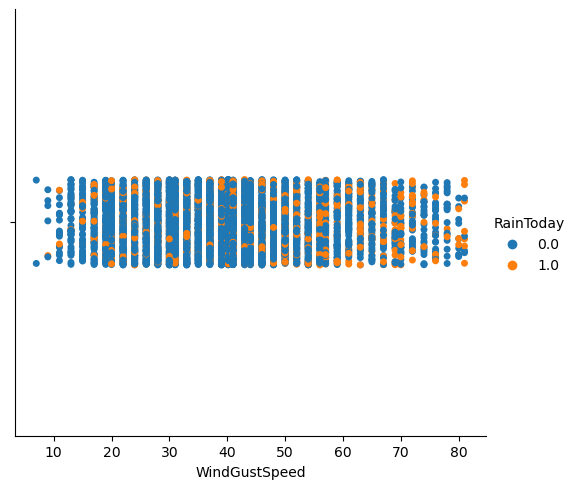

In [83]:
#Visualizing WindGustSpeed w.rt. the label
ax = sns.catplot(x='WindGustSpeed', data=df, hue='RainToday')
print(df['WindGustSpeed'].value_counts())

With more wind gust speed the chances of rain for today is high.

2.080084    770
0.000000    738
2.351335    673
1.587401    603
2.223980    588
1.912931    557
1.817121    501
2.571282    468
2.466212    434
2.668402    410
2.714418    400
2.884499    293
2.802039    265
1.259921    253
3.036589    210
2.962496    201
3.141381    147
3.107233    102
2.401368     70
3.271066     69
3.207534     68
3.332222     48
3.448217     42
3.391211     29
3.530348     27
3.503398     21
Name: WindSpeed9am, dtype: int64


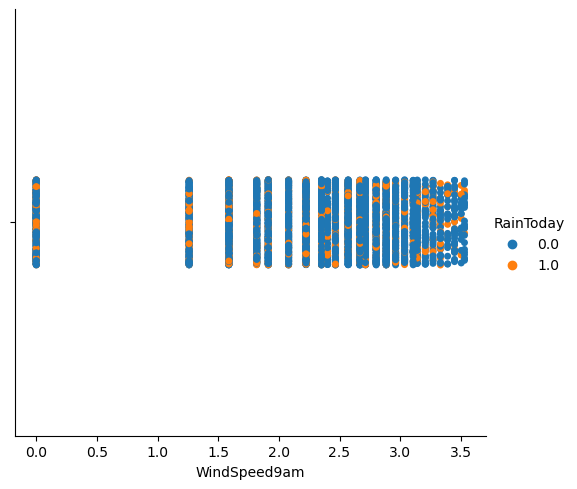

In [84]:
#Visualizing WindSpeed9am w.rt. the label
ax = sns.catplot(x='WindSpeed9am', data=df, hue='RainToday')
print(df['WindSpeed9am'].value_counts())

With high wind speed at 9am the chances of rain for today is more.

9.000000     699
19.000000    619
13.000000    581
20.000000    570
17.000000    535
11.000000    513
15.000000    508
24.000000    485
28.000000    434
22.000000    433
26.000000    366
7.000000     319
4.000000     279
30.000000    253
31.000000    251
6.000000     235
0.000000     195
33.000000    149
35.000000    123
18.533662    105
37.000000    104
39.000000     73
2.000000      58
41.000000     39
46.000000     24
43.000000     24
44.000000     13
Name: WindSpeed3pm, dtype: int64


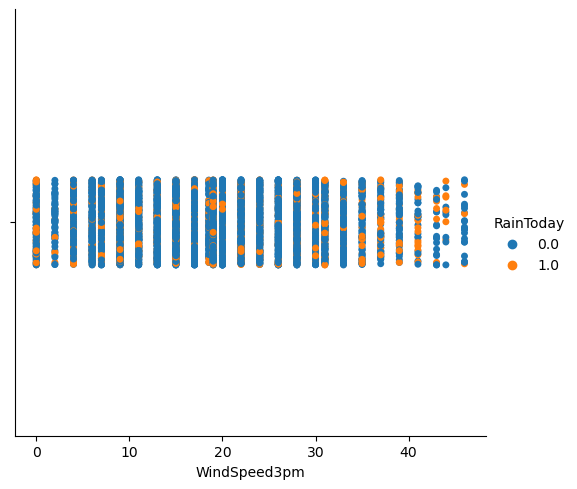

In [85]:
#Visualizing WindSpeed3pm w.rt. the label
ax = sns.catplot(x='WindSpeed3pm', data=df, hue='RainToday')
print(df['WindSpeed3pm'].value_counts())

With high wind speed at 3pm the chances of rain for today is higher.

68.0    196
62.0    195
73.0    192
67.0    184
74.0    184
       ... 
18.0      6
21.0      5
22.0      4
26.0      4
19.0      3
Name: Humidity9am, Length: 84, dtype: int64


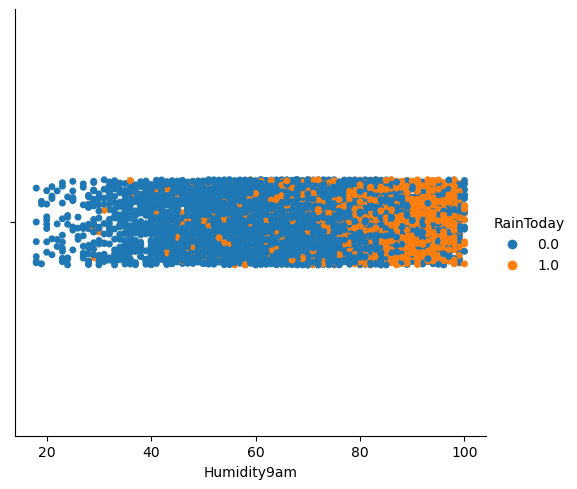

In [86]:
#Visualizing Humidity9am w.rt. the label
ax = sns.catplot(x='Humidity9am', data=df, hue='RainToday')
print(df['Humidity9am'].value_counts())

With high humidity at 9am the chances of rain is high.

49.0    189
48.0    187
54.0    186
53.0    185
51.0    183
       ... 
8.0       7
98.0      6
7.0       5
99.0      3
6.0       1
Name: Humidity3pm, Length: 95, dtype: int64


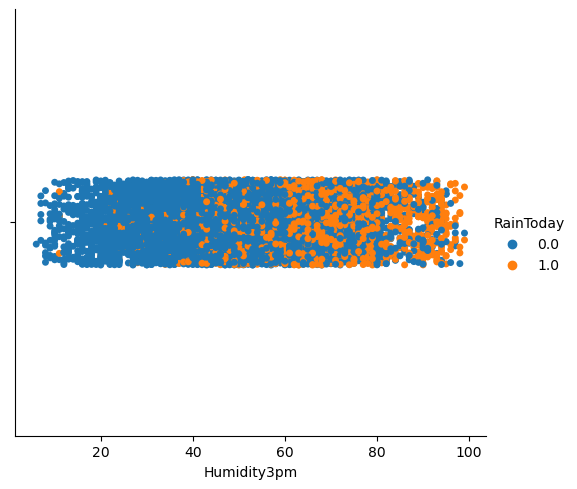

In [87]:
#Visualizing Humidity3pm w.rt. the label
ax = sns.catplot(x='Humidity3pm', data=df, hue='RainToday')
print(df['Humidity3pm'].value_counts())

With high humidity at 3pm the chances of rain is high.

1017.640233    1273
1014.800000      56
1016.100000      54
1019.200000      53
1019.600000      53
               ... 
1003.800000       1
1035.500000       1
1036.300000       1
1032.500000       1
1033.600000       1
Name: Pressure9am, Length: 346, dtype: int64


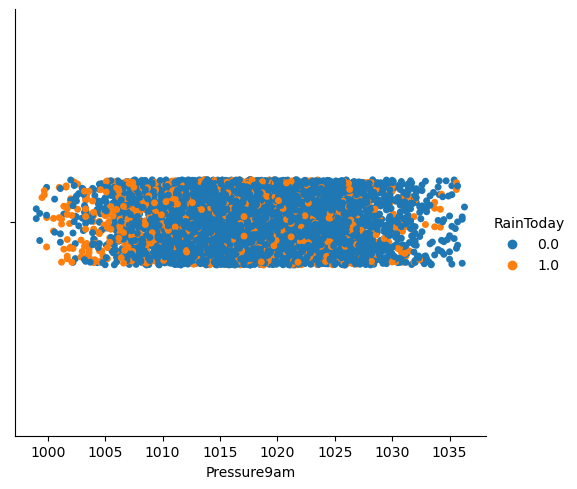

In [88]:
#Visualizing Pressure9am w.rt. the label
ax = sns.catplot(x='Pressure9am', data=df, hue='RainToday')
print(df['Pressure9am'].value_counts())

With high pressure at 9am higher is the chances of rainfall for today.

1015.236075    1276
1017.800000      58
1018.000000      53
1011.100000      51
1015.500000      50
               ... 
1030.000000       1
996.900000        1
997.600000        1
1033.800000       1
1029.500000       1
Name: Pressure3pm, Length: 345, dtype: int64


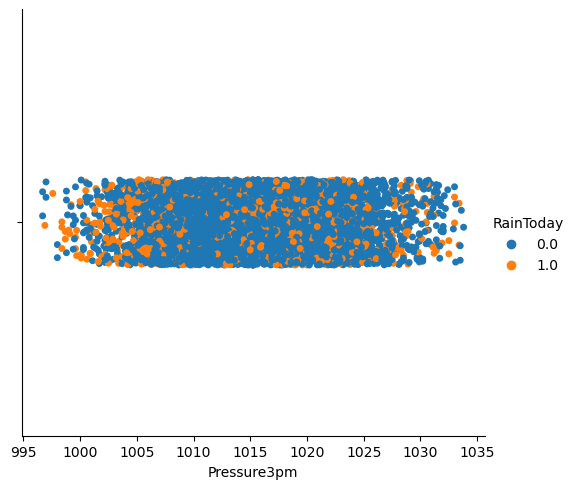

In [89]:
#Visualizing Pressure3pm w.rt. the label
ax = sns.catplot(x='Pressure3pm', data=df, hue='RainToday')
print(df['Pressure3pm'].value_counts())

With high pressure at 3pm higher is the chances of rainfall for today.

4.566622    2300
7.000000    1340
1.000000    1000
8.000000     929
0.000000     532
6.000000     527
5.000000     391
3.000000     361
2.000000     349
4.000000     258
Name: Cloud9am, dtype: int64


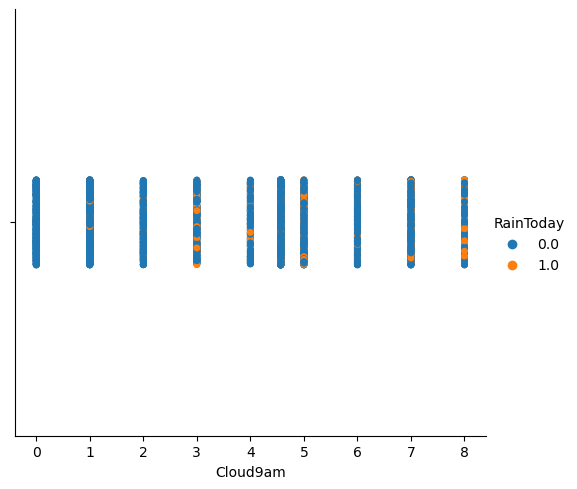

In [90]:
#Visualizing Cloud9am w.rt. the label
ax = sns.catplot(x='Cloud9am', data=df, hue='RainToday')
print(df['Cloud9am'].value_counts())

With high clouds at 9am rainfall probability for today is high.

4.503183    2323
7.000000    1200
1.000000    1028
8.000000     794
6.000000     572
5.000000     508
2.000000     491
3.000000     397
0.000000     339
4.000000     335
Name: Cloud3pm, dtype: int64


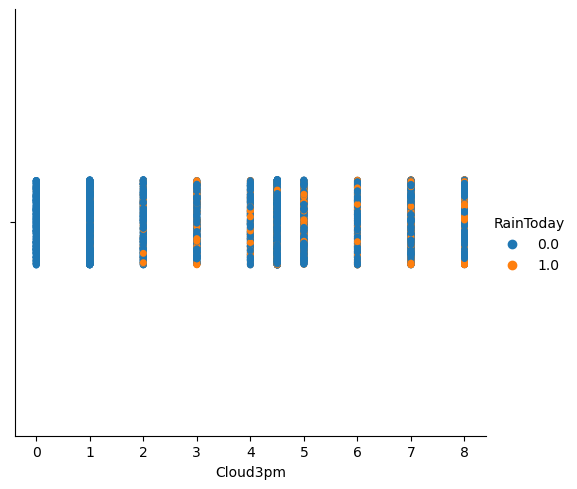

In [91]:
#Visualizing Cloud3pm w.rt. the label
ax = sns.catplot(x='Cloud3pm', data=df, hue='RainToday')
print(df['Cloud3pm'].value_counts())

With high clouds at 3pm rainfall probability for today is high.

14.8    72
18.3    71
18.0    69
23.0    66
17.5    66
        ..
2.5      1
2.0      1
3.5      1
3.4      1
30.2     1
Name: Temp9am, Length: 301, dtype: int64


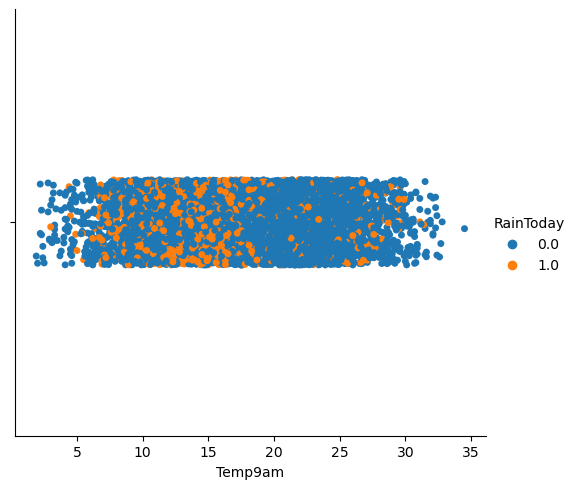

In [92]:
#Visualizing Temp9am w.rt. the label
ax = sns.catplot(x='Temp9am', data=df, hue='RainToday')
print(df['Temp9am'].value_counts())

The higher the temperature at 9am the less chances of rainfall and the lower the temperature the higher the chances of rainfall for today.

22.442934    96
19.200000    75
19.000000    71
22.500000    69
18.500000    68
             ..
8.700000      1
36.700000     1
37.400000     1
8.600000      1
37.800000     1
Name: Temp3pm, Length: 314, dtype: int64


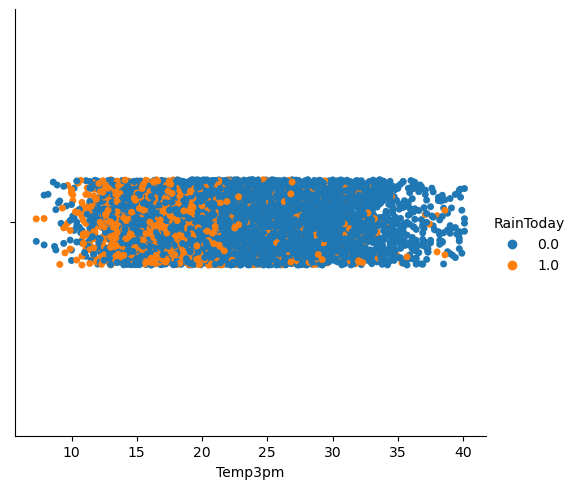

In [102]:
#Visualizing Temp3pm w.rt. the label
ax = sns.catplot(x='Temp3pm', data=df, hue='RainToday')
print(df['Temp3pm'].value_counts())

The higher the temperature at 3pm the less chances of rainfall and the lower the temperature the higher the chances of rainfall for today.

### Checking for correlation

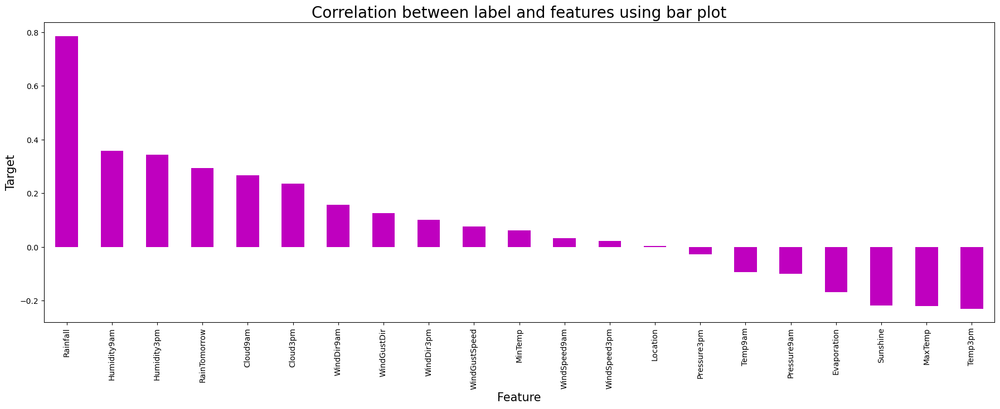

In [103]:
#Visualizing the correlation using bar plot
plt.figure(figsize = (22,7))
df.corr()['RainToday'].sort_values(ascending = False).drop(['RainToday']).plot(kind='bar', color='m')
plt.xlabel('Feature', fontsize=15)
plt.ylabel('Target', fontsize=15)
plt.title("Correlation between label and features using bar plot", fontsize=20)
plt.show()

In [104]:
df.corr()['RainToday'].sort_values(ascending = False).drop(['RainToday'])

Rainfall         0.786196
Humidity9am      0.357752
Humidity3pm      0.342991
RainTomorrow     0.294528
Cloud9am         0.267858
Cloud3pm         0.235157
WindDir9am       0.156452
WindGustDir      0.125947
WindDir3pm       0.100286
WindGustSpeed    0.076677
MinTemp          0.061728
WindSpeed9am     0.032495
WindSpeed3pm     0.022687
Location         0.002934
Pressure3pm     -0.028149
Temp9am         -0.094349
Pressure9am     -0.098965
Evaporation     -0.167423
Sunshine        -0.219089
MaxTemp         -0.219747
Temp3pm         -0.229670
Name: RainToday, dtype: float64

We can see that Rainfall has 78% correlation with RainToday. So we need to drop it.

In [105]:
df.drop('Rainfall', axis=1, inplace=True)

In [106]:
#Let's check again
df.corr()['RainToday'].sort_values(ascending = False).drop(['RainToday'])

Humidity9am      0.357752
Humidity3pm      0.342991
RainTomorrow     0.294528
Cloud9am         0.267858
Cloud3pm         0.235157
WindDir9am       0.156452
WindGustDir      0.125947
WindDir3pm       0.100286
WindGustSpeed    0.076677
MinTemp          0.061728
WindSpeed9am     0.032495
WindSpeed3pm     0.022687
Location         0.002934
Pressure3pm     -0.028149
Temp9am         -0.094349
Pressure9am     -0.098965
Evaporation     -0.167423
Sunshine        -0.219089
MaxTemp         -0.219747
Temp3pm         -0.229670
Name: RainToday, dtype: float64

Now everything looks good. Let's go ahead.

We have checked for skewness and reduced those having high skewness. Now we will separate the features and label.

### Separating features and label

In [108]:
x1 = df.drop("RainToday", axis=1)
y1 = df["RainToday"]

### Standard Scaler to scale tha features

In [109]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)
x1

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
0,-1.508427,0.056444,-0.145732,0.255563,-0.013374,1.168336,0.364103,1.199868,1.410700,0.707154,0.638072,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.543635
1,-1.508427,-1.058476,0.220676,0.255563,-0.013374,1.393511,0.364103,-0.408924,1.637392,-0.647365,0.421555,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.543635
2,-1.508427,-0.036466,0.320605,0.255563,-0.013374,1.618687,0.520531,1.199868,1.637392,0.651849,0.854590,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.543635
3,-1.508427,-0.724000,0.703668,0.255563,-0.013374,-0.858244,-1.200173,0.280558,-1.762985,0.117716,-0.985811,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.543635
4,-1.508427,0.818306,1.419829,0.255563,-0.013374,1.168336,0.129462,-1.558061,-0.176142,-0.256122,0.205037,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.543635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913248,-0.062457,0.255563,-0.013374,-1.758946,-0.652677,0.280558,-1.536293,0.270778,-0.769293,-1.030114,-1.513226,1.137532,0.829435,0.011773,0.013138,-1.358595,0.004208,-0.543635
7983,1.029423,-1.764592,0.253986,0.255563,-0.013374,-0.407893,-1.356601,0.280558,-1.082910,0.270778,-0.985811,-0.726555,-1.679648,0.953678,0.626930,0.011773,0.013138,-1.215007,0.364014,-0.543635
7984,1.029423,-1.430116,0.520464,0.255563,-0.013374,-1.083419,-0.183394,0.280558,1.410700,-0.055228,-0.985811,-0.908690,-1.513226,0.535827,0.238796,0.011773,0.013138,-0.927832,0.638152,-0.543635
7985,1.029423,-0.984148,0.537119,0.255563,-0.013374,0.267634,-0.887318,0.510385,-1.082910,0.270778,-1.202329,-1.030114,-1.513226,0.268402,0.188170,-0.633229,-1.076661,-0.461172,0.621019,-0.543635


### Checking for VIF

In [110]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x1.values, i)
                    for i in range(len(x1.columns))]
vif["Features"] = x1.columns
vif

,VIF Values,Features
0,1.165956,Location
1,8.251093,MinTemp
2,26.189354,MaxTemp
3,1.509146,Evaporation
4,1.981817,Sunshine
5,1.656800,WindGustDir
6,2.176063,WindGustSpeed
7,1.330018,WindDir9am
8,1.540276,WindDir3pm
9,1.675509,WindSpeed9am


In [111]:
#Let's drop columns with high VIF values
x1.drop(['Temp3pm', 'MaxTemp', 'Pressure9am'], axis=1, inplace=True)    #Dropping at once

In [112]:
#Let's check again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x1.values, i)
                    for i in range(len(x1.columns))]
vif["Features"] = x1.columns
vif

,VIF Values,Features
0,1.162538,Location
1,8.016022,MinTemp
2,1.480595,Evaporation
3,1.966356,Sunshine
4,1.629620,WindGustDir
5,2.141915,WindGustSpeed
6,1.278086,WindDir9am
7,1.474457,WindDir3pm
8,1.657590,WindSpeed9am
9,1.928311,WindSpeed3pm


Done!

In [113]:
#Checking for value counts in label
y1.value_counts()

0.0    6171
1.0    1816
Name: RainToday, dtype: int64

In [114]:
#Let's balance the data using OverSampling
#Using OverSampling method or SMOTE() to balance the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()

x1,y1 = SM.fit_resample(x1,y1)   

In [115]:
#Let's check
y1.value_counts()

0.0    6171
1.0    6171
Name: RainToday, dtype: int64

Done!

### Data Modelling

In [116]:
#Finding best random state
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x1_train, x1_test, y1_train, y1_test = train_test_split(x1,y1, test_size = 0.30, random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x1_train, y1_train)
    pred = RFR.predict(x1_test)
    acc = accuracy_score(y1_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
        
print("Best accuracy score is", maxAccu, "at random_state", maxRS)        

Best accuracy score is 0.9376181474480151 at random_state 92


### Creating Train Test Split

In [117]:
x1_train, x1_test, y1_train, y1_test = train_test_split(x1,y1, test_size = 0.30, random_state=maxRS)

### Model Training

In [118]:
#Checking accuracy for Random Forest Classifier
RF = RandomForestClassifier()
RF.fit(x1_train, y1_train)
predRF = RF.predict(x1_test)
print(accuracy_score(y1_test, predRF))
print(confusion_matrix(y1_test, predRF))
print(classification_report(y1_test, predRF))

0.937888198757764
[[1749  119]
 [ 111 1724]]
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94      1868
         1.0       0.94      0.94      0.94      1835

    accuracy                           0.94      3703
   macro avg       0.94      0.94      0.94      3703
weighted avg       0.94      0.94      0.94      3703



In [119]:
#Logistic Regression
LR = LogisticRegression()
LR.fit(x1_train, y1_train)
predLR = LR.predict(x1_test)
print(accuracy_score(y1_test, predLR))
print(confusion_matrix(y1_test, predLR))
print(classification_report(y1_test, predLR))

0.7518228463408048
[[1404  464]
 [ 455 1380]]
              precision    recall  f1-score   support

         0.0       0.76      0.75      0.75      1868
         1.0       0.75      0.75      0.75      1835

    accuracy                           0.75      3703
   macro avg       0.75      0.75      0.75      3703
weighted avg       0.75      0.75      0.75      3703



In [120]:
#Decision Tree
DT = DecisionTreeClassifier()
DT.fit(x1_train, y1_train)
predDT = DT.predict(x1_test)
print(accuracy_score(y1_test, predDT))
print(confusion_matrix(y1_test, predDT))
print(classification_report(y1_test, predDT))

0.8636240885768296
[[1604  264]
 [ 241 1594]]
              precision    recall  f1-score   support

         0.0       0.87      0.86      0.86      1868
         1.0       0.86      0.87      0.86      1835

    accuracy                           0.86      3703
   macro avg       0.86      0.86      0.86      3703
weighted avg       0.86      0.86      0.86      3703



In [121]:
#SVC
svc = SVC()
svc.fit(x1_train, y1_train)
predsvc = svc.predict(x1_test)
print(accuracy_score(y1_test, predsvc))
print(confusion_matrix(y1_test, predsvc))
print(classification_report(y1_test, predsvc))

0.8414798811774237
[[1521  347]
 [ 240 1595]]
              precision    recall  f1-score   support

         0.0       0.86      0.81      0.84      1868
         1.0       0.82      0.87      0.84      1835

    accuracy                           0.84      3703
   macro avg       0.84      0.84      0.84      3703
weighted avg       0.84      0.84      0.84      3703



In [122]:
#Gradient Boosting
GBC = GradientBoostingClassifier()
GBC.fit(x1_train, y1_train)
predGBC = GBC.predict(x1_test)
print(accuracy_score(y1_test, predGBC))
print(confusion_matrix(y1_test, predGBC))
print(classification_report(y1_test, predGBC))

0.859303267620848
[[1604  264]
 [ 257 1578]]
              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86      1868
         1.0       0.86      0.86      0.86      1835

    accuracy                           0.86      3703
   macro avg       0.86      0.86      0.86      3703
weighted avg       0.86      0.86      0.86      3703



In [123]:
#Ada Boost
AB = AdaBoostClassifier()
AB.fit(x1_train, y1_train)
predAB = AB.predict(x1_test)
print(accuracy_score(y1_test, predAB))
print(confusion_matrix(y1_test, predAB))
print(classification_report(y1_test, predAB))

0.8050229543613286
[[1520  348]
 [ 374 1461]]
              precision    recall  f1-score   support

         0.0       0.80      0.81      0.81      1868
         1.0       0.81      0.80      0.80      1835

    accuracy                           0.81      3703
   macro avg       0.81      0.80      0.80      3703
weighted avg       0.81      0.81      0.81      3703



In [124]:
#Bagging Classifier
BC = BaggingClassifier()
BC.fit(x1_train, y1_train)
predBC = BC.predict(x1_test)
print(accuracy_score(y1_test, predBC))
print(confusion_matrix(y1_test, predBC))
print(classification_report(y1_test, predBC))

0.9033216311099109
[[1706  162]
 [ 196 1639]]
              precision    recall  f1-score   support

         0.0       0.90      0.91      0.91      1868
         1.0       0.91      0.89      0.90      1835

    accuracy                           0.90      3703
   macro avg       0.90      0.90      0.90      3703
weighted avg       0.90      0.90      0.90      3703



In [125]:
#Extra Trees
ETC = ExtraTreesClassifier()
ETC.fit(x1_train, y1_train)
predETC = ETC.predict(x1_test)
print(accuracy_score(y1_test, predETC))
print(confusion_matrix(y1_test, predETC))
print(classification_report(y1_test, predETC))

0.943289224952741
[[1731  137]
 [  73 1762]]
              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94      1868
         1.0       0.93      0.96      0.94      1835

    accuracy                           0.94      3703
   macro avg       0.94      0.94      0.94      3703
weighted avg       0.94      0.94      0.94      3703



Random Forest Classifier gives the best accuracy of 94%.

### Cross Validation Score

In [126]:
#Checking cv score Random Forest Classifier
score = cross_val_score(RF,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predRF) - score.mean())

[0.74807614 0.74281085 0.85170178 0.8363047  0.86264182]
0.8083070594004227
Difference between Accuracy score and cross validation score is -  0.12958113935734128


In [127]:
#Checking cv score Logistic Regression
score = cross_val_score(LR,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predLR) - score.mean())

[0.68853787 0.71729445 0.62074554 0.69124797 0.79943274]
0.7034517153710877
Difference between Accuracy score and cross validation score is -  0.04837113096971701


In [128]:
#Checking cv score Decision Tree Classifier
score = cross_val_score(DT,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predDT) - score.mean())

[0.66747671 0.73025516 0.84846029 0.75688817 0.72893031]
0.7464021286973053
Difference between Accuracy score and cross validation score is -  0.11722195987952433


In [129]:
#Checking cv score Gradient Boosting Classifier
score = cross_val_score(GBC,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predGBC) - score.mean())

[0.61198866 0.64074524 0.70097245 0.70786062 0.69773096]
0.6718595839626933
Difference between Accuracy score and cross validation score is -  0.18744368365815467


In [130]:
#Checking cv score AdaBoost Classifier
score = cross_val_score(AB,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predAB) - score.mean())

[0.51559336 0.6399352  0.67828201 0.69124797 0.68111831]
0.6412353704575308
Difference between Accuracy score and cross validation score is -  0.16378758390379788


In [131]:
#Checking cv score Bagging Classifier
score = cross_val_score(BC,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predBC) - score.mean())

[0.70230863 0.73390036 0.86142626 0.82374392 0.85453809]
0.7951834514593602
Difference between Accuracy score and cross validation score is -  0.10813817965055073


In [132]:
#Checking cv score ExtraTrees Classifier
score = cross_val_score(ETC,x1,y1)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y1_test, predETC) - score.mean())

[0.75860672 0.7618469  0.89141005 0.89019449 0.839141  ]
0.8282398335798258
Difference between Accuracy score and cross validation score is -  0.11504939137291526


Logistic Regression gives the least difference between accuracy and cross validation score. So we will go with it and tune the parameters to see if we can increase the score.

### Hyper parameter Tuning

In [133]:
#Logistic Regression
parameters = {'penalty': ['l1', 'l2', 'elasticnet', 'None'],
             'fit_intercept': [True, False],
             'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'saga'],
             'multi_class': ['auto', 'ovr', 'multinomial']}

In [134]:
grid = GridSearchCV(LogisticRegression(), parameters, cv=5)

In [135]:
grid.fit(x1_train, y1_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'fit_intercept': [True, False],
                         'multi_class': ['auto', 'ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet', 'None'],
                         'solver': ['lbfgs', 'liblinear', 'newton-cg',
                                    'newton-cholesky', 'saga']})

In [136]:
grid.best_params_

{'fit_intercept': True,
 'multi_class': 'auto',
 'penalty': 'l1',
 'solver': 'liblinear'}

In [138]:
Final_model = LogisticRegression(fit_intercept = True,
                                multi_class = 'auto',
                                penalty = 'l1',
                                solver = 'liblinear')
Final_model.fit(x1_train, y1_train)
pred = Final_model.predict(x1_test)
acc = accuracy_score(y1_test, pred)
print(acc*100)

75.18228463408047


We got 75% accuracy on our final model. Let's go ahead and save the model.

### Saving the model

In [139]:
filename = 'Rain_Today.pkl'
pickle.dump(Final_model, open(filename, 'wb'))

In [141]:
loaded_Model = pickle.load(open ('Rain_Today.pkl','rb'))
result = loaded_Model.score(x1_test, y1_test)
print(result*100)

75.18228463408047


In [142]:
conclusion = pd.DataFrame([loaded_Model.predict(x1_test)[:], y1_test[:]], index=["Predicted", "Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,3693,3694,3695,3696,3697,3698,3699,3700,3701,3702
Predicted,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0
Original,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


Done!!!